In [ ]:
from rbibm.utils.utils_data import query

from rbibm.utils.utils_data import query, query_main, remove_entry_by_id, query_rob_metric, get_model_by_idx
from rbibm.plots.multi_plots import multi_plot
from rbibm.plots.metric_plots import plot_by_num_simulations, plot_expected_coverage, plot_approximation_metric, plot_rob_tolerance_plot
from rbibm.plots.sweep_plots import plot_mulitobjective_paretto_front
from rbibm.plots.main_plots import plot_posterior, plot_adversarial_posterior, plot_posterior_predictive, plot_adversarial_posterior_predictive
from rbibm.plots.styles import use_style

import matplotlib.pyplot as plt 

: 

In [ ]:
import torch
torch.manual_seed(0)

: 

In [ ]:
name = "super_final_benchmark_modified"
name = "super_final_benchmark"
df = query(name)

: 

In [21]:
color_map = {0.0001: "C0",0.001: "C1",0.01: "C3",0.1: "C4", 0.5: "C5",1.: "C6", 10.: "C7",100.: "C8"}

In [22]:
task = ["gaussian_linear", "sir", "lotka_volterra", "hudgkin_huxley", "vae_task", "spatial_sir"]

In [23]:
idxs_final = []

In [24]:
figsize_col=2.
figsize_row_expected_cov = 2.
figsize_row_rob = 1.8

In [25]:
ids = query_main(name)

In [26]:
color_map_eps = {0.: "#252525", 0.1: "#feb24c", 0.2:"#fd8d3c", 0.3: "#fc4e2a", 0.5:"#e31a1c", 1.: "#bd0026", 2.:"#800026" }
color_map_defenses = {"None": "#0868ac", "FIMTraceRegularizer": "#8856a7", "L2PGDTargetedAdversarialTraining": "#df65b0", "L2PGDrKLTrades": "#2ca25f"}

In [27]:
id1 = query_main(name, defense = "FIMTraceRegularizer", params_defense_beta=0.001, task="gaussian_linear")
id2 = query_main(name, defense = "FIMTraceRegularizer", params_defense_beta=0.1, task="sir")
id3 = query_main(name, defense = "FIMTraceRegularizer", params_defense_beta=0.01, task="lotka_volterra")
id4 = query_main(name, defense = "FIMTraceRegularizer", params_defense_beta=100., task="hudgkin_huxley")
id5 = query_main(name, defense = "FIMTraceRegularizer", params_defense_beta=0.01, task="vae_task")
id6 = query_main(name, defense = "FIMTraceRegularizer", params_defense_beta=0.1, task="spatial_sir")

idxs_final.extend(id1.id.tolist() + id2.id.tolist() + id3.id.tolist() + id4.id.tolist() + id5.id.tolist() + id6.id.tolist())

In [28]:
query_main(name, defense="FIMTraceRegularizer", model_name="maf", id=idxs_final)

,id,task,loss,defense,model_name,N_train,N_val,N_test,train_loss,validation_loss,test_loss,train_time,sim_time,seed
112,336a986e-3d7c-4480-ab97-6586b392f488,vae_task,NLLLoss,FIMTraceRegularizer,maf,1000,512,10000,-2.481565e+00,-1.852474e+00,-2.367895,7.090354,NaN,0
116,38dbb112-198f-4eb4-b45f-50135b2c522b,vae_task,NLLLoss,FIMTraceRegularizer,maf,10000,512,10000,-4.866080e+00,-4.592717e+00,-4.880874,26.627257,NaN,0
127,ff3d1d22-3282-4ca8-9690-548617631bb9,vae_task,NLLLoss,FIMTraceRegularizer,maf,100000,512,10000,-5.450074e+00,-5.629629e+00,-5.794137,168.140538,NaN,0
234,b208b2c8-c5e3-447b-bccf-ef0b88bd625e,lotka_volterra,NLLLoss,FIMTraceRegularizer,maf,1000,512,10000,-3.670333e+00,-2.530309e+00,-2.197972,10.498975,NaN,0
236,6c629f5c-a11e-4e41-8373-81f4fa330166,gaussian_linear,NLLLoss,FIMTraceRegularizer,maf,1000,512,10000,-2.961111e+00,2.903743e-01,-0.016715,13.960799,NaN,0
243,54d219fd-fcfe-4547-b848-20bb473af688,lotka_volterra,NLLLoss,FIMTraceRegularizer,maf,10000,512,10000,-4.358694e+00,-4.249133e+00,-4.326019,38.367327,NaN,0
246,9de1e433-c753-4a2a-a0ec-32ec9552f4a7,gaussian_linear,NLLLoss,FIMTraceRegularizer,maf,10000,512,10000,-2.605537e+00,-2.348975e+00,-2.293762,49.958947,NaN,0
254,f61f99cf-0a77-43fd-a7ea-1c6bfa254291,sir,NLLLoss,FIMTraceRegularizer,maf,1000,512,10000,2.595570e+00,3.288556e+00,2.734775,4.883403,NaN,0
261,f2c2525e-f001-4d37-90ab-9a178d06ba97,sir,NLLLoss,FIMTraceRegularizer,maf,10000,512,10000,2.019521e+00,1.879337e+00,1.975022,24.190092,NaN,0
271,9383e00f-3667-4eed-a7c2-5b9ee8d1f95f,sir,NLLLoss,FIMTraceRegularizer,maf,100000,512,10000,1.912107e+00,1.969642e+00,1.906392,103.892022,NaN,0


In [ ]:
query(name, id=idxs_final)

,id,task,loss,defense,model_name,N_train,N_val,N_test,train_loss,validation_loss,...,c2st_x_xtilde,eval_time_rob,metric_approx_tilde,main_value_approx_tilde,additional_value_approx_tilde,main_value_approx_unsecure,additional_value_approx_unsecure,main_value_tilde_to_x,additional_value_tilde_to_x,eval_time_rob_approx
0,778101c6-dd42-454e-abc4-36b6a6838b8f,vae_task,NLLLoss,FIMTraceRegularizer,gaussian,1000,512,10000,-2.503200,-1.327648,...,0.10170,363.207257,NegativeLogLikelihoodMetric,-1.343273,"{'q00_5': -4.480923652648926, 'q02_5': -4.1512...",-1.390357,"{'q00_5': -4.509489059448242, 'q02_5': -4.1883...",NaN,NaN,0.031328
1,778101c6-dd42-454e-abc4-36b6a6838b8f,vae_task,NLLLoss,FIMTraceRegularizer,gaussian,1000,512,10000,-2.503200,-1.327648,...,0.10170,363.207257,ExpectedCoverageMetric,0.049952,"{'alphas': [0.0, 0.010101010091602802, 0.02020...",0.055858,"{'alphas': [0.0, 0.010101010091602802, 0.02020...",NaN,NaN,4.101720
2,778101c6-dd42-454e-abc4-36b6a6838b8f,vae_task,NLLLoss,FIMTraceRegularizer,gaussian,1000,512,10000,-2.503200,-1.327648,...,0.10170,363.207257,NegativeLogLikelihoodMetric,-1.343273,"{'q00_5': -4.480923652648926, 'q02_5': -4.1512...",-1.390357,"{'q00_5': -4.509489059448242, 'q02_5': -4.1883...",NaN,NaN,0.031328
3,778101c6-dd42-454e-abc4-36b6a6838b8f,vae_task,NLLLoss,FIMTraceRegularizer,gaussian,1000,512,10000,-2.503200,-1.327648,...,0.10170,363.207257,ExpectedCoverageMetric,0.049952,"{'alphas': [0.0, 0.010101010091602802, 0.02020...",0.055858,"{'alphas': [0.0, 0.010101010091602802, 0.02020...",NaN,NaN,4.101720
4,778101c6-dd42-454e-abc4-36b6a6838b8f,vae_task,NLLLoss,FIMTraceRegularizer,gaussian,1000,512,10000,-2.503200,-1.327648,...,0.09885,352.946246,NegativeLogLikelihoodMetric,-1.265400,"{'q00_5': -4.430984973907471, 'q02_5': -4.1103...",-1.390357,"{'q00_5': -4.509489059448242, 'q02_5': -4.1883...",NaN,NaN,0.026285
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4306,2a80b846-e785-4791-a098-0fb6553a7595,hudgkin_huxley,NLLLoss,FIMTraceRegularizer,multivariate_gaussian,100000,512,10000,11.342979,11.521999,...,0.84165,120.888214,ExpectedCoverageMetric,0.086382,"{'alphas': [0.0, 0.010101010091602802, 0.02020...",0.210081,"{'alphas': [0.0, 0.010101010091602802, 0.02020...",NaN,NaN,3.870061
4307,2a80b846-e785-4791-a098-0fb6553a7595,hudgkin_huxley,NLLLoss,FIMTraceRegularizer,multivariate_gaussian,100000,512,10000,11.342979,11.521999,...,0.97105,112.451056,NegativeLogLikelihoodMetric,13.327223,"{'q00_5': 8.481186866760254, 'q02_5': 9.902664...",11.380054,"{'q00_5': 8.091790199279785, 'q02_5': 8.917493...",NaN,NaN,0.014244
4308,2a80b846-e785-4791-a098-0fb6553a7595,hudgkin_huxley,NLLLoss,FIMTraceRegularizer,multivariate_gaussian,100000,512,10000,11.342979,11.521999,...,0.97105,112.451056,ExpectedCoverageMetric,0.207950,"{'alphas': [0.0, 0.010101010091602802, 0.02020...",0.210049,"{'alphas': [0.0, 0.010101010091602802, 0.02020...",NaN,NaN,3.862690
4309,2a80b846-e785-4791-a098-0fb6553a7595,hudgkin_huxley,NLLLoss,FIMTraceRegularizer,multivariate_gaussian,100000,512,10000,11.342979,11.521999,...,0.97105,112.451056,NegativeLogLikelihoodMetric,13.327223,"{'q00_5': 8.481186866760254, 'q02_5': 9.902664...",11.380054,"{'q00_5': 8.091790199279785, 'q02_5': 8.917493...",NaN,NaN,0.014244


In [ ]:
query_main(name)

{'task': 'gaussian_linear', 'N_train': 100000, 'id': ['182ad76d-b756-4080-b695-9d485f4aa05b', '3fa630a2-7634-4002-9b6c-a278c3a739e3', '21bcfb59-13e9-4802-a943-7bde3a1d509c', '5edcb5c2-1520-49c5-96a1-cb3f20bd5f5f', '032c983b-8b9b-4190-b05b-bae249f45a38', '6a435015-5bda-4b35-bb15-39c1fc813811', '67c5f91b-c4b0-455f-a4c8-82aa94cb77ea', '41a7d52a-bc42-4ed4-96e5-8e697253fa77', '18fc33cc-b447-4426-9c01-77b2f1c567eb', '6c629f5c-a11e-4e41-8373-81f4fa330166', '9de1e433-c753-4a2a-a0ec-32ec9552f4a7', '0ad2b336-3d4a-486e-9826-c2867dfd7cd5', '8be30814-853d-48c7-8c7a-637792523ced', '3eae3290-4af3-438e-be9c-aaf5ee2c0c02', '99f4da47-c4e8-487d-ba6e-9ac84f49e9cd', 'c846db3f-dbb7-40e7-90b1-267ee841fbc3', 'a28aeaea-a7cc-4337-b6e4-1950d40ff9bc', '81f5bc50-ea62-44b1-908f-f304d54efceb', '0f6be498-3ba4-4a75-b01e-c8fb438dd715', '7b7170e0-4533-4da3-a2e0-ca45c8fbee63', '38f9fc1d-2284-4b22-9a95-f992c1dfa5a6', 'f13e109e-1b94-431d-b47c-c4d94973a340', '756989c2-6d08-465a-9939-e3cdaa5d0d85', '39581294-14e3-4d3a-91e8-2

/mnt/qb/home/macke/mgloeckler90/old_env/rbibm/rbibm/plots/multi_plots.py:259: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


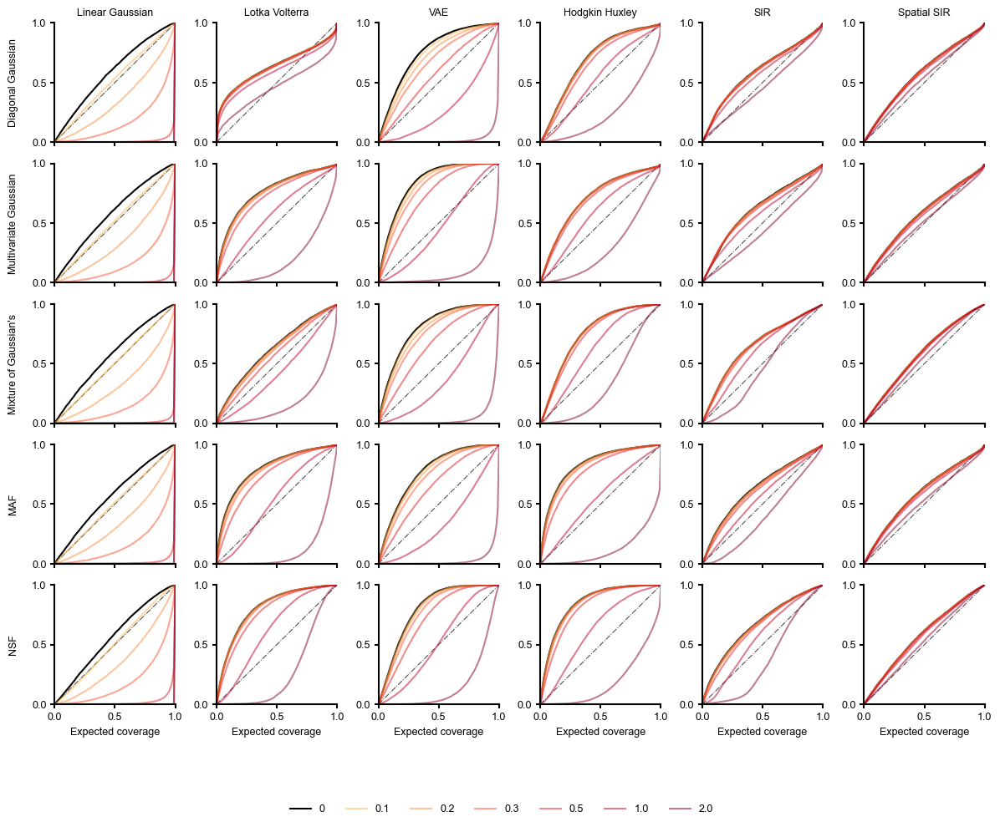

In [12]:
with use_style("pyloric"):
    fig, axes = multi_plot(name, "task",  "model_name",plot_expected_coverage, task=task, N_train=100000, 
                           id=idxs_final, figsize_per_col=figsize_col, color_map=color_map_eps, figsize_per_row=figsize_col - 0.2, with_grid=False, with_eps=True, hue="eps", verbose=False, loss="NLLLoss",  metric_rob="ReverseKLRobMetric", attack="L2PGDAttack")
    fig.savefig(f"expected_coverages_fisher_by_model_by_task.svg")
    plt.show()

In [ ]:
# id1 = query_main(name, defense = "L2PGDTrades", params_defense_eps=0.1, N_train=100000, model_name="maf", task="gaussian_linear")
# id2 = query_main(name, defense = "L2PGDTrades", params_defense_eps=0.5, N_train=100000, model_name="maf", task="sir")
# id3 = query_main(name, defense = "L2PGDTrades", params_defense_eps=0.5, N_train=100000, model_name="maf", task="lotka_volterra")
# id4 = query_main(name, defense = "L2PGDTrades", params_defense_eps=0.5, N_train=100000, model_name="maf", task="hudgkin_huxley")
# id5 = query_main(name, defense = "L2PGDTrades", params_defense_eps=0.1, N_train=100000, model_name="maf", task="vae_task")
# id6 = query_main(name, defense = "L2PGDTrades", params_defense_eps=0.5, N_train=100000, model_name="maf", task="spatial_sir")

# idxs_final.extend([id1.id.iloc[0],id2.id.iloc[0],id3.id.iloc[0],id4.id.iloc[0],id5.id.iloc[0],id6.id.iloc[0]])

In [29]:
id1 = query_main(name, defense = "L2PGDrKLTrades", params_defense_eps=0.1, task="gaussian_linear")
id2 = query_main(name, defense = "L2PGDrKLTrades", params_defense_eps=0.5, task="sir")
id3 = query_main(name, defense = "L2PGDrKLTrades", params_defense_eps=0.5, task="lotka_volterra")
id4 = query_main(name, defense = "L2PGDrKLTrades", params_defense_eps=0.5, task="hudgkin_huxley")
id5 = query_main(name, defense = "L2PGDrKLTrades", params_defense_eps=0.1, task="vae_task")
id6 = query_main(name, defense = "L2PGDrKLTrades", params_defense_eps=0.5, task="spatial_sir")

idxs_final.extend(id1.id.tolist() + id2.id.tolist() + id3.id.tolist() + id4.id.tolist() + id5.id.tolist() + id6.id.tolist())

In [30]:
id1 = query_main(name, defense = "L2PGDTargetedAdversarialTraining", params_defense_eps=0.1, task="gaussian_linear")
id2 = query_main(name, defense = "L2PGDTargetedAdversarialTraining", params_defense_eps=1., task="sir")
id3 = query_main(name, defense = "L2PGDTargetedAdversarialTraining", params_defense_eps=1., task="lotka_volterra")
id4 = query_main(name, defense = "L2PGDTargetedAdversarialTraining", params_defense_eps=1., task="hudgkin_huxley")
id5 = query_main(name, defense = "L2PGDTargetedAdversarialTraining", params_defense_eps=1., task="vae_task")
id6 = query_main(name, defense = "L2PGDTargetedAdversarialTraining", params_defense_eps=1., task="spatial_sir")

idxs_final.extend(id1.id.tolist() + id2.id.tolist() + id3.id.tolist() + id4.id.tolist() + id5.id.tolist() + id6.id.tolist())

In [31]:
id1 = query_main(name, defense = "None",  model_name="maf", task="gaussian_linear")
id2 = query_main(name, defense = "None", model_name="maf", task="sir")
id3 = query_main(name, defense = "None", model_name="maf", task="lotka_volterra")
id4 = query_main(name, defense = "None", model_name="maf", task="hudgkin_huxley")
id5 = query_main(name, defense = "None",  model_name="maf", task="vae_task")
id6 = query_main(name, defense = "None", model_name="maf", task="spatial_sir")

idxs_final.extend(id1.id.tolist() + id2.id.tolist() + id3.id.tolist() + id4.id.tolist() + id5.id.tolist() + id6.id.tolist())

In [32]:
defense = ["FIMTraceRegularizer", "L2PGDrKLTrades", "L2PGDTargetedAdversarialTraining"]

In [33]:
for n in [100000]:
    with use_style("pyloric"):
        fig, axes = multi_plot(name, "task", "model_name", plot_rob_tolerance_plot, figsize_per_col=figsize_col, figsize_per_row=1.2, min_clip=1e-10, verbose=False, N_train=n, task=task, hue="params_defense_beta", defense="FIMTraceRegularizer",
                                legend=False,attack="L2PGDAttack", expand_params_defense=True, metric_rob="ReverseKLRobMetric", plot_kwargs={"color_map":color_map})   
        fig.savefig(f"fim_trace_defense_task_models_hyperparameter_n{n}_rKL.svg")
        plt.show()

{'min_clip': 1e-10, 'verbose': False, 'N_train': 100000, 'task': 'gaussian_linear', 'hue': 'params_defense_beta', 'defense': 'FIMTraceRegularizer', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'min_clip': 1e-10, 'verbose': False, 'N_train': 100000, 'task': 'lotka_volterra', 'hue': 'params_defense_beta', 'defense': 'FIMTraceRegularizer', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'min_clip': 1e-10, 'verbose': False, 'N_train': 100000, 'task': 'vae_task', 'hue': 'params_defense_beta', 'defense': 'FIMTraceRegularizer', 'legend': False, 'attack': 'L2PGDAtt

In [18]:
for n in [100000]:
    with use_style("pyloric"):
        fig, axes = multi_plot(name, "task", "model_name", plot_rob_tolerance_plot, verbose=False,figsize_per_col=figsize_col, figsize_per_row=1.2,min_clip=1e-12,
                                N_train=n, task=task, hue="params_defense_beta", defense="FIMTraceRegularizer", legend=False,attack="L2PGDAttack", expand_params_defense=True, metric_rob="ForwardKLRobMetric", plot_kwargs={"color_map":color_map})   
        fig.savefig(f"fim_trace_defense_task_models_hyperparameter_n{n}_fKL.svg")
        plt.show()

ValueError: No columns found in the dataset with label task

{'verbose': False, 'task': 'gaussian_linear', 'N_train': 1000, 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ForwardKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'task': 'sir', 'N_train': 1000, 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ForwardKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'task': 'lotka_volterra', 'N_train': 1000, 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ForwardKLRobMetric', 'plot_kwargs'

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


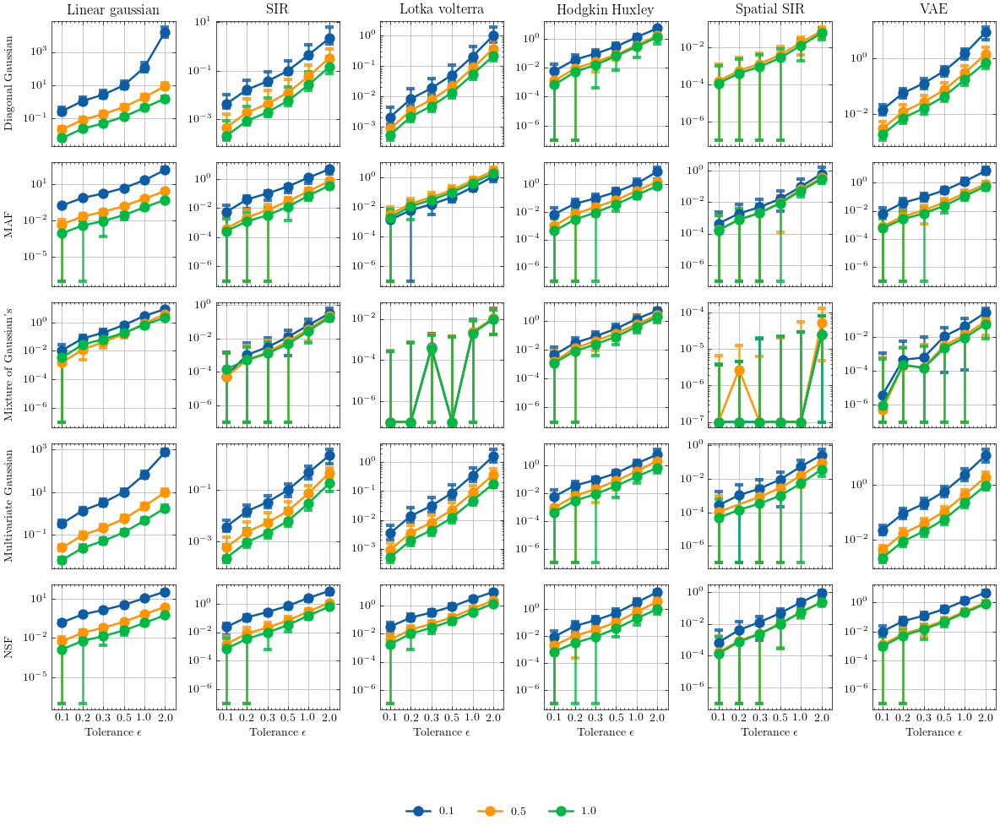

{'verbose': False, 'task': 'gaussian_linear', 'N_train': 10000, 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ForwardKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'task': 'sir', 'N_train': 10000, 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ForwardKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'task': 'lotka_volterra', 'N_train': 10000, 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ForwardKLRobMetric', 'plot_kwar

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


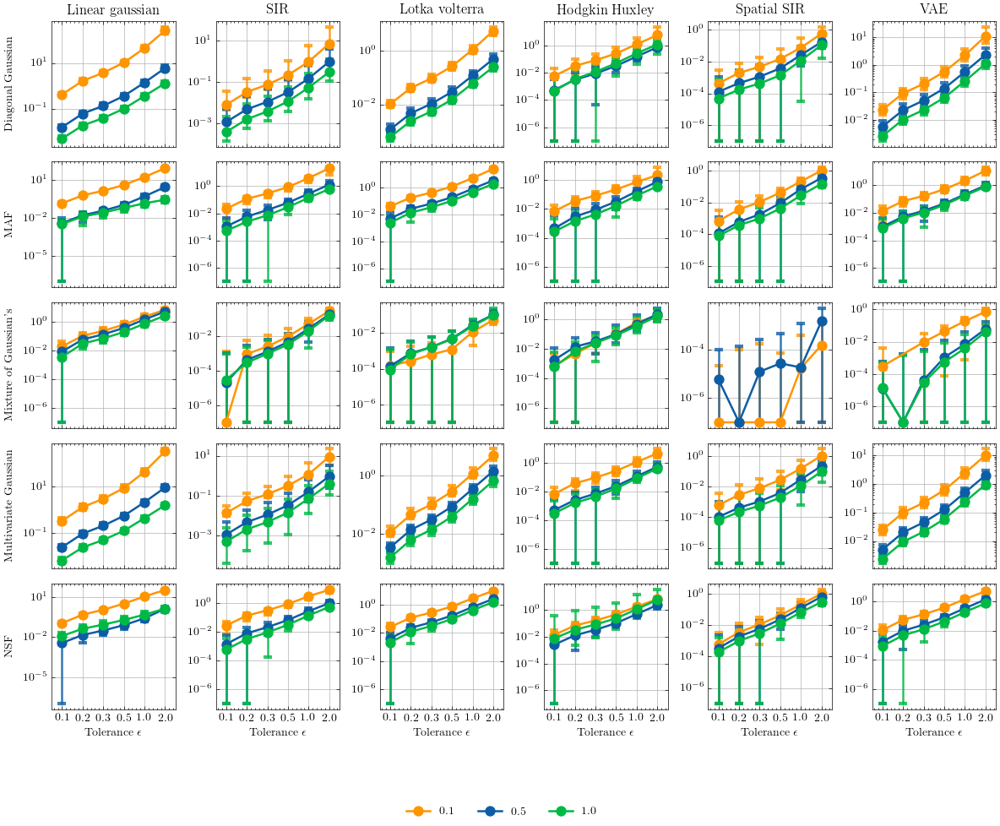

{'verbose': False, 'task': 'gaussian_linear', 'N_train': 100000, 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ForwardKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'task': 'sir', 'N_train': 100000, 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ForwardKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'task': 'lotka_volterra', 'N_train': 100000, 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ForwardKLRobMetric', 'plot_k

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


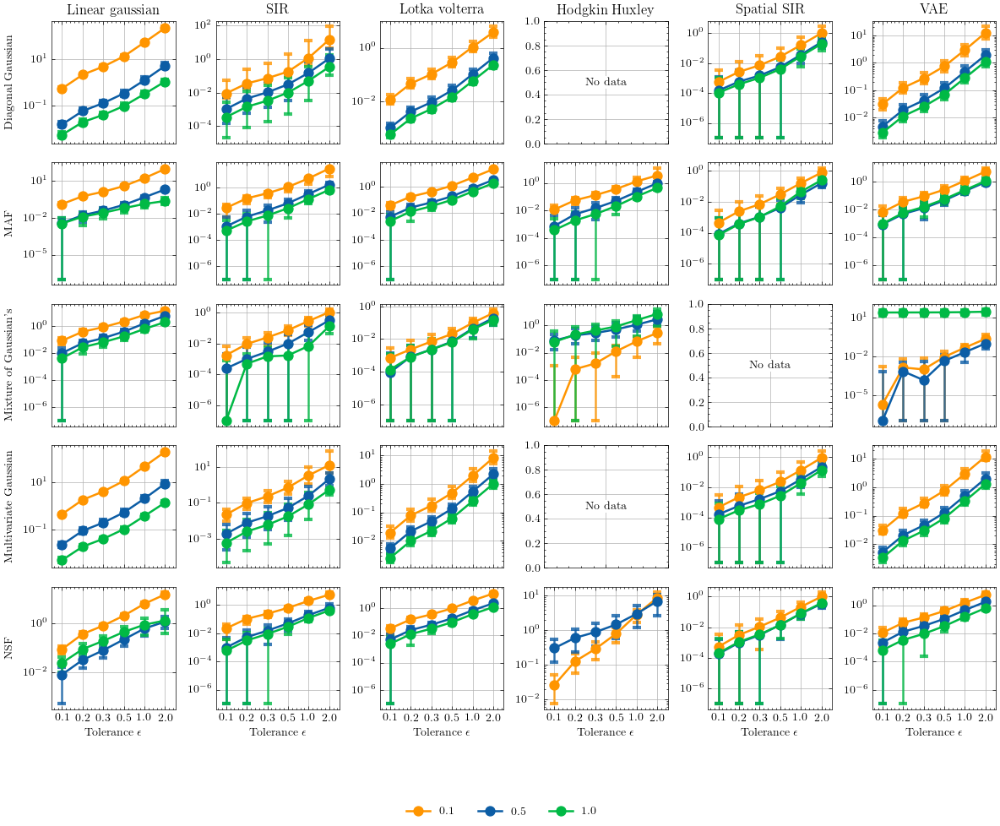

In [ ]:
for n in [1000,10000,100000]:
    with use_style("science_grid"):
        fig, axes = multi_plot(name, "task", "model_name", plot_rob_tolerance_plot, verbose=False, task=task,figsize_per_col=figsize_col, figsize_per_row=figsize_row_rob, N_train=n, hue="params_defense_eps", defense="L2PGDrKLTrades",
                                legend=False,attack="L2PGDAttack", expand_params_defense=True, metric_rob="ForwardKLRobMetric", plot_kwargs={"color_map":color_map})   
        fig.savefig(f"l2pgdTrades_defense_task_models_hyperparameter_n{n}_fKL.svg")
        plt.show()

{'verbose': False, 'N_train': 1000, 'task': 'gaussian_linear', 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 1000, 'task': 'sir', 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 1000, 'task': 'lotka_volterra', 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_kwargs'

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


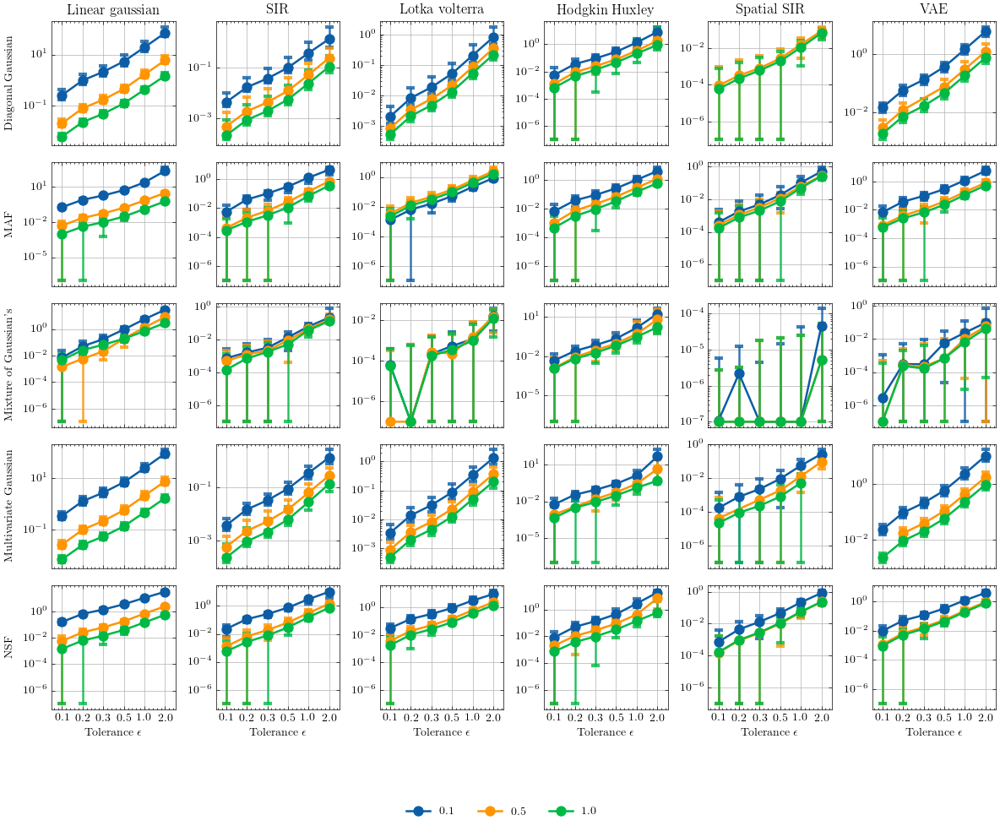

{'verbose': False, 'N_train': 10000, 'task': 'gaussian_linear', 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 10000, 'task': 'sir', 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 10000, 'task': 'lotka_volterra', 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_kwar

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


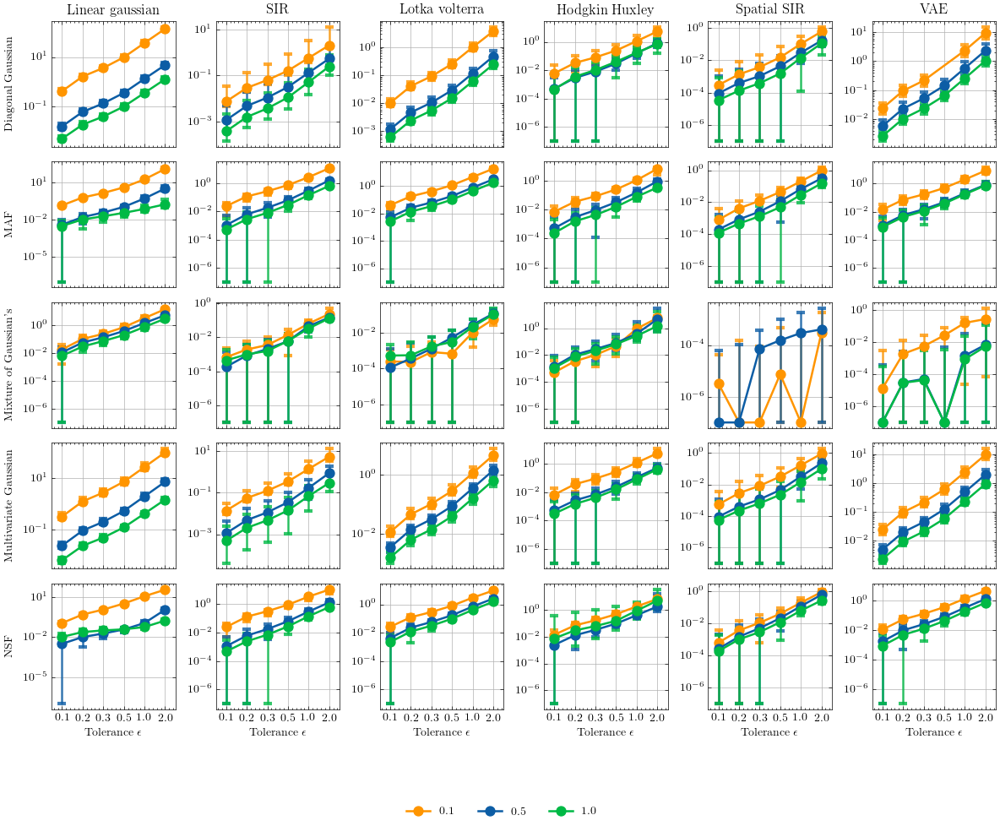

{'verbose': False, 'N_train': 100000, 'task': 'gaussian_linear', 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 100000, 'task': 'sir', 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 100000, 'task': 'lotka_volterra', 'hue': 'params_defense_eps', 'defense': 'L2PGDrKLTrades', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_k

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


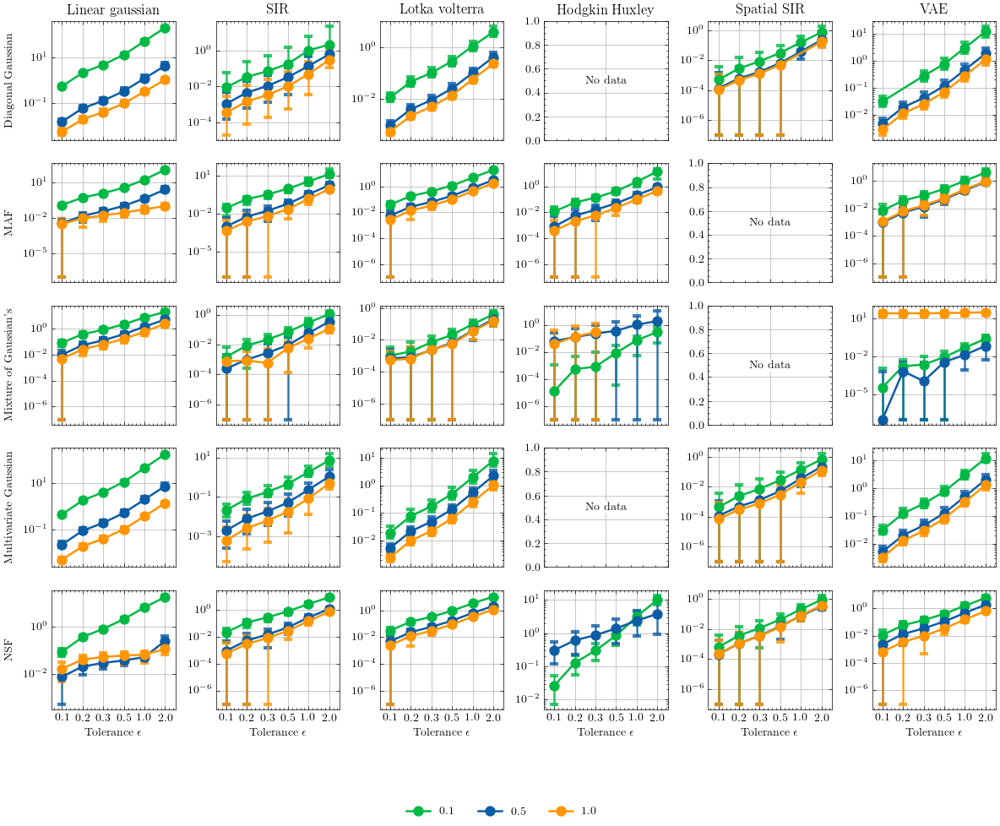

In [ ]:
for n in [1000,10000,100000]:
    with use_style("science_grid"):
        fig, axes = multi_plot(name, "task", "model_name", plot_rob_tolerance_plot, verbose=False, N_train=n, task=task, hue="params_defense_eps", defense="L2PGDrKLTrades", figsize_per_col=figsize_col, figsize_per_row=figsize_row_rob,
                               legend=False,attack="L2PGDAttack", expand_params_defense=True, metric_rob="ReverseKLRobMetric", plot_kwargs={"color_map":color_map})   
        fig.savefig(f"l2pgdTrades_defense_task_models_hyperparameter_n{n}_rKL.svg")
        plt.show()

{'verbose': False, 'N_train': 1000, 'task': 'gaussian_linear', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ForwardKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 1000, 'task': 'sir', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ForwardKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 1000, 'task': 'lotka_volterra', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': T

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


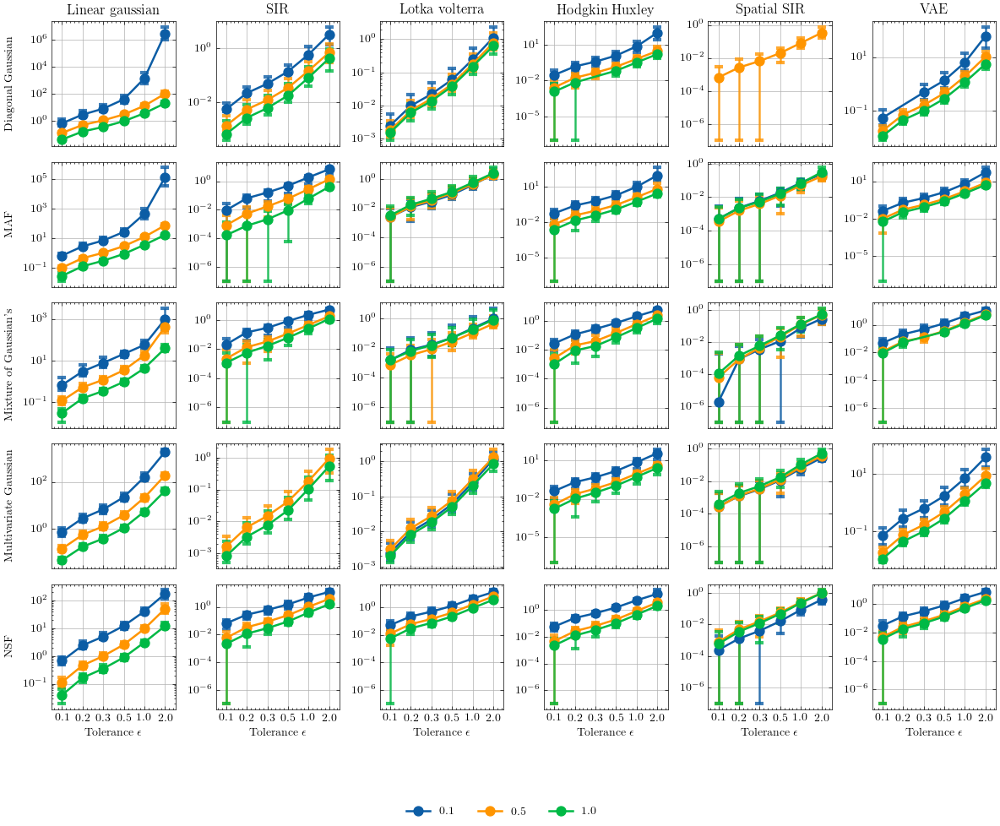

{'verbose': False, 'N_train': 10000, 'task': 'gaussian_linear', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ForwardKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 10000, 'task': 'sir', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ForwardKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 10000, 'task': 'lotka_volterra', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense'

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


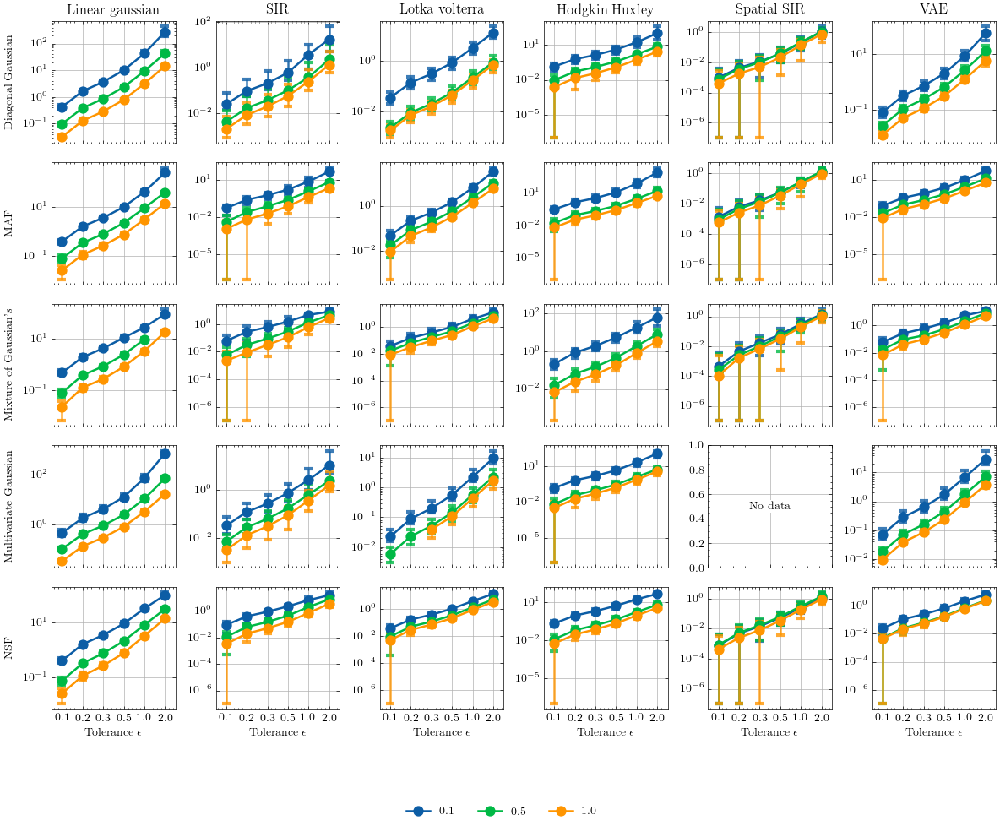

{'verbose': False, 'N_train': 100000, 'task': 'gaussian_linear', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ForwardKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 100000, 'task': 'sir', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ForwardKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 100000, 'task': 'lotka_volterra', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defen

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


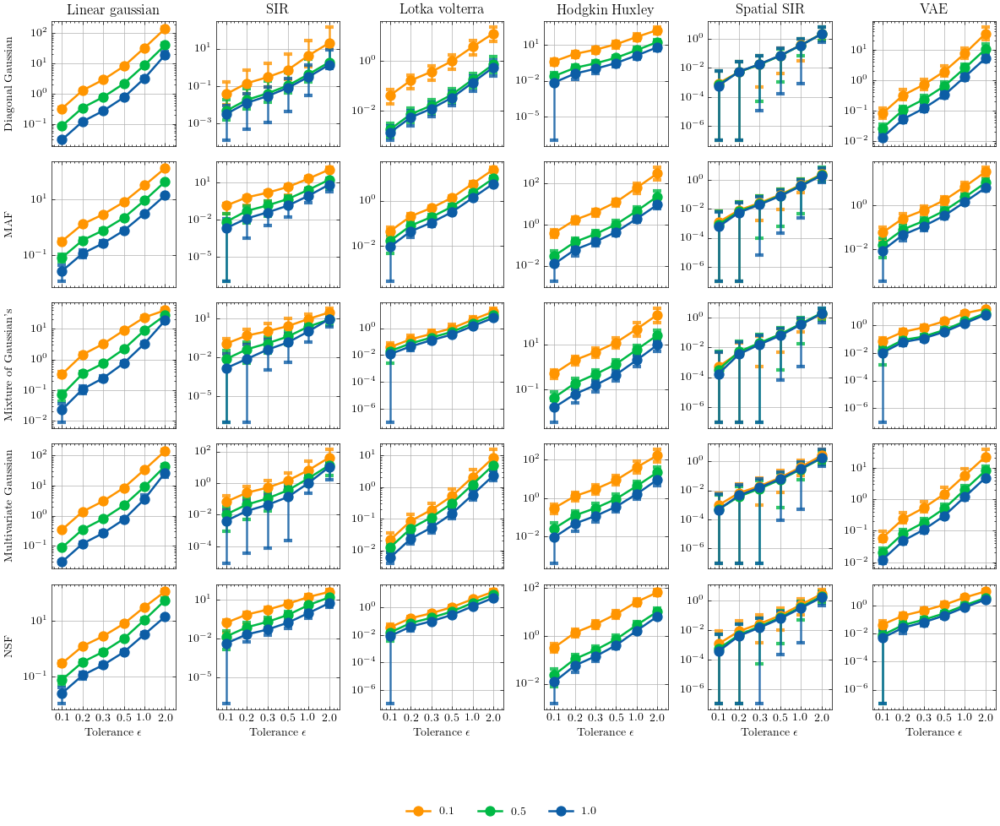

In [ ]:
for n in [1000,10000,100000]:
    with use_style("science_grid"):
        fig, axes = multi_plot(name, "task", "model_name", plot_rob_tolerance_plot, verbose=False,figsize_per_col=figsize_col, figsize_per_row=figsize_row_rob, N_train=n, task=task, hue="params_defense_eps", defense="L2PGDTargetedAdversarialTraining", 
                               legend=False,attack="L2PGDAttack", expand_params_defense=True, metric_rob="ForwardKLRobMetric", plot_kwargs={"color_map":color_map})   
        fig.savefig(f"l2pgdAdvTrain_defense_task_models_hyperparameter_n{n}_fKL.svg")
        plt.show()

{'verbose': False, 'N_train': 1000, 'task': 'gaussian_linear', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 1000, 'task': 'sir', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 1000, 'task': 'lotka_volterra', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': T

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


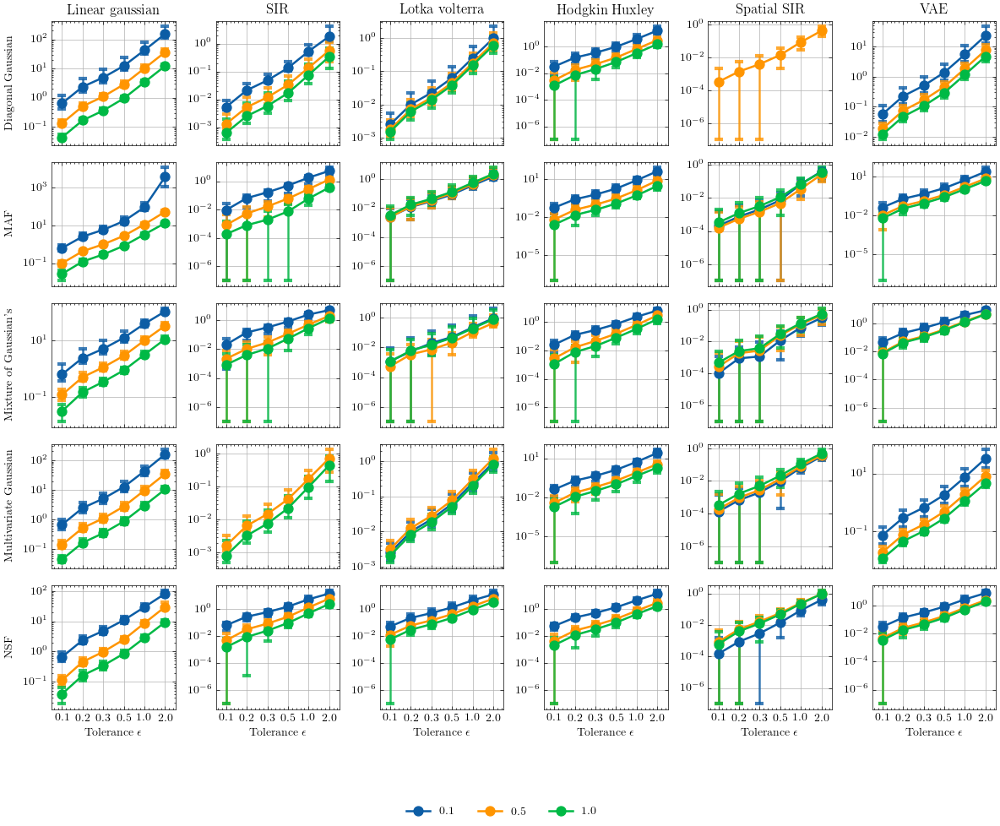

{'verbose': False, 'N_train': 10000, 'task': 'gaussian_linear', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 10000, 'task': 'sir', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 10000, 'task': 'lotka_volterra', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense'

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


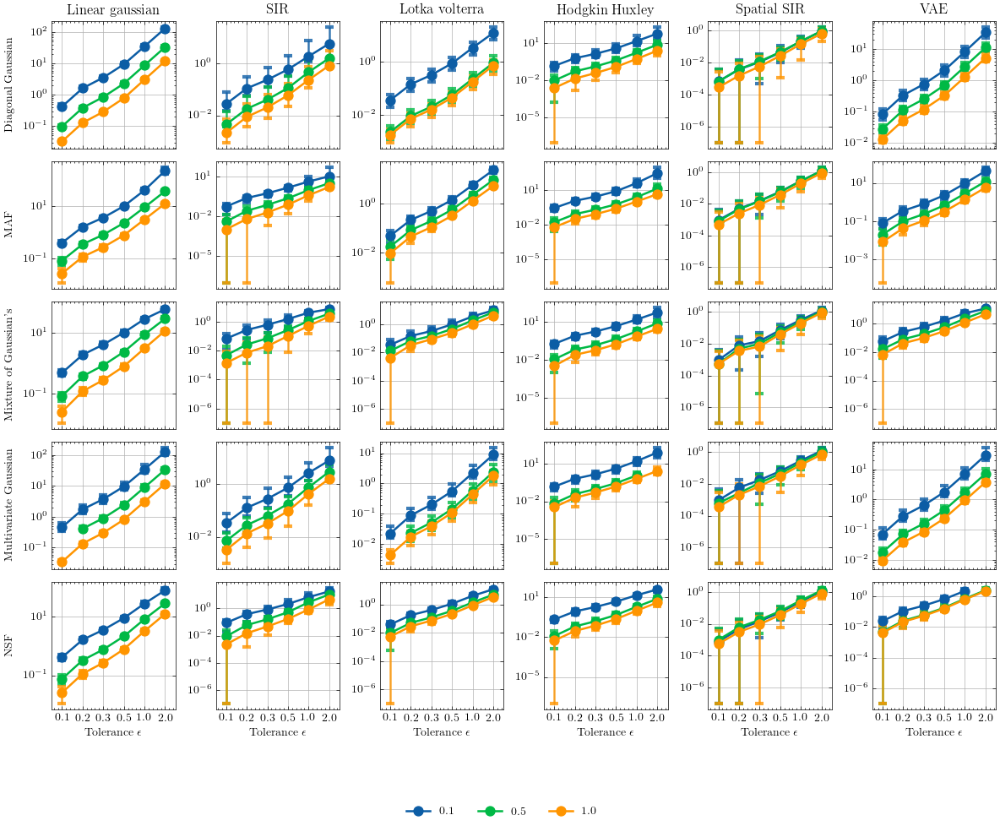

{'verbose': False, 'N_train': 100000, 'task': 'gaussian_linear', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 100000, 'task': 'sir', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defense': True, 'metric_rob': 'ReverseKLRobMetric', 'plot_kwargs': {'color_map': {0.0001: 'C0', 0.001: 'C1', 0.01: 'C3', 0.1: 'C4', 0.5: 'C5', 1.0: 'C6', 10.0: 'C7', 100.0: 'C8'}}, 'model_name': 'gaussian'}
{'verbose': False, 'N_train': 100000, 'task': 'lotka_volterra', 'hue': 'params_defense_eps', 'defense': 'L2PGDTargetedAdversarialTraining', 'legend': False, 'attack': 'L2PGDAttack', 'expand_params_defen

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


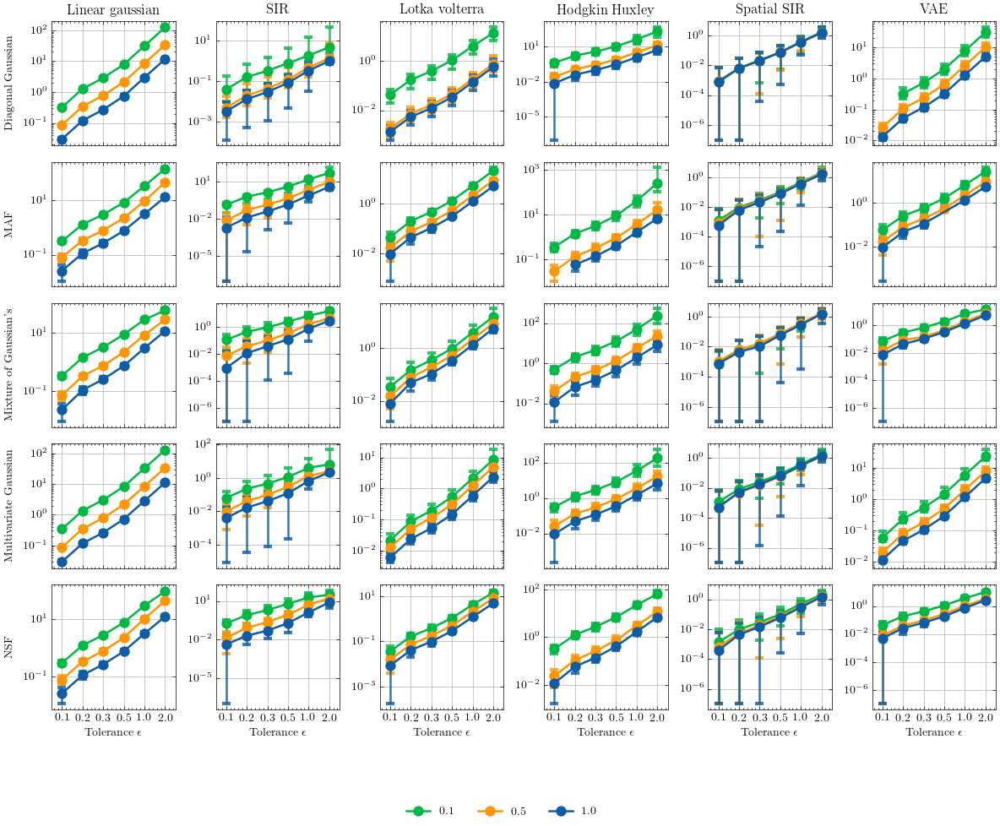

In [28]:
for n in [1000,10000,100000]:
    with use_style("science_grid"):
        fig, axes = multi_plot(name, "task", "model_name", plot_rob_tolerance_plot, verbose=False, N_train=n, task=task, hue="params_defense_eps",figsize_per_col=figsize_col, figsize_per_row=figsize_row_rob,
                                defense="L2PGDTargetedAdversarialTraining", legend=False,attack="L2PGDAttack", expand_params_defense=True, metric_rob="ReverseKLRobMetric", plot_kwargs={"color_map":color_map})   
        fig.savefig(f"l2pgdAdvTrain_defense_task_models_hyperparameter_n{n}_rKL.svg")
        plt.show()

{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.0001, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.001, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.01, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': T

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


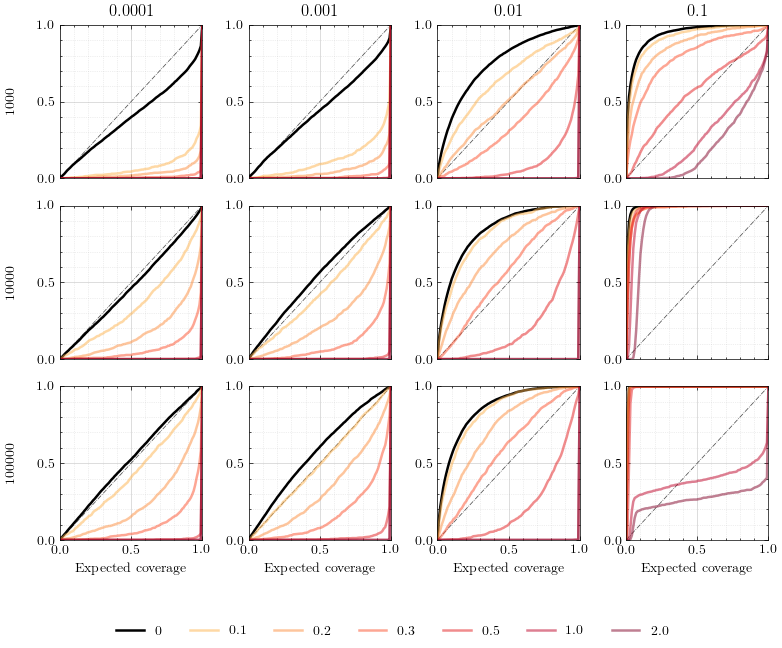

{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.0001, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.001, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.01, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NL

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


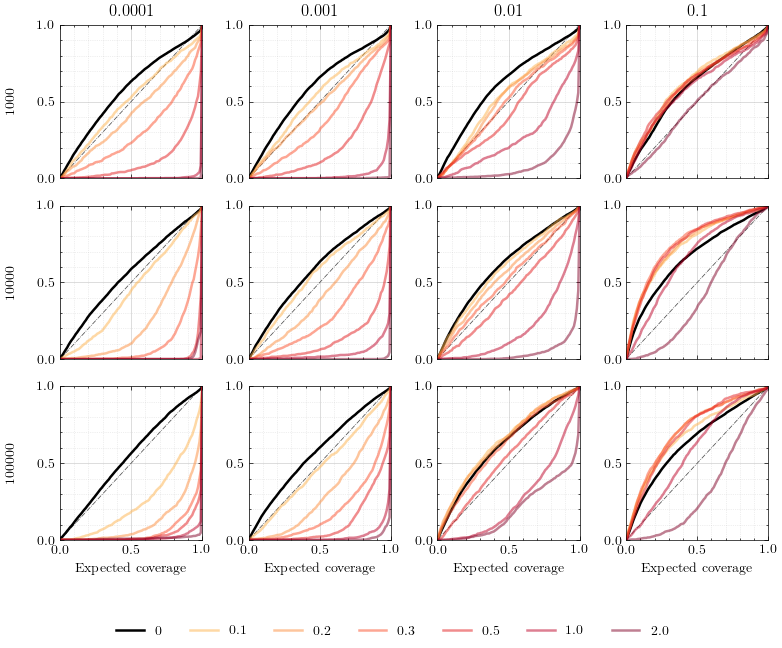

{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.0001, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.001, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.01, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True,

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


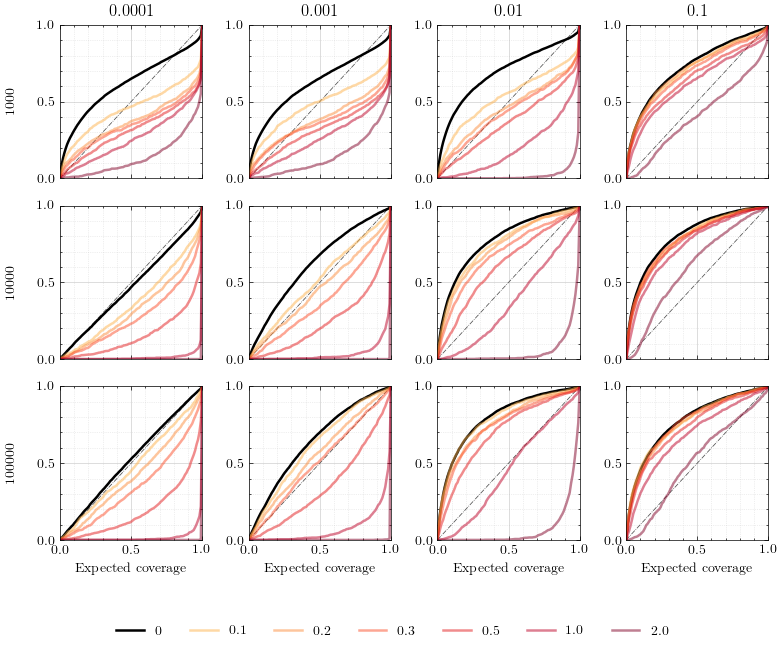

{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.1, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 1.0, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 10.0, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


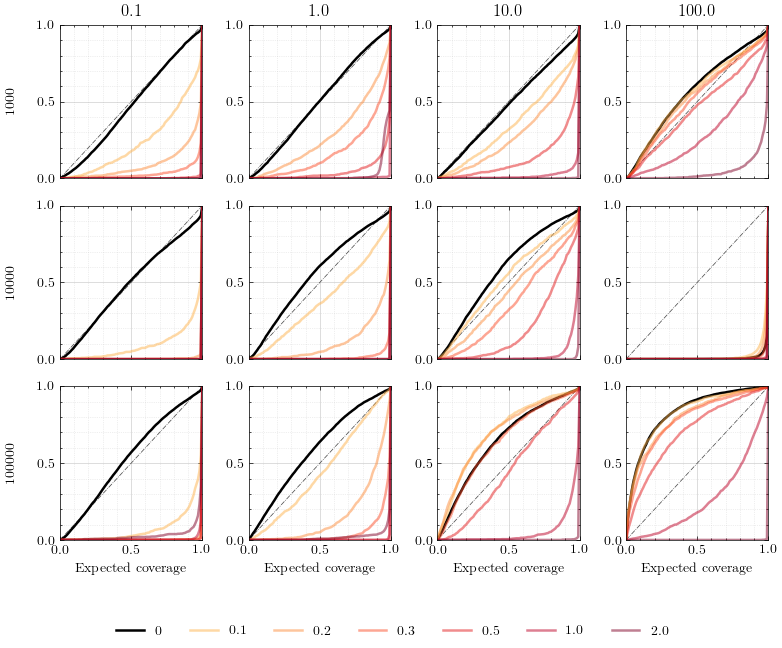

{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.01, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.1, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 1.0, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'v

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


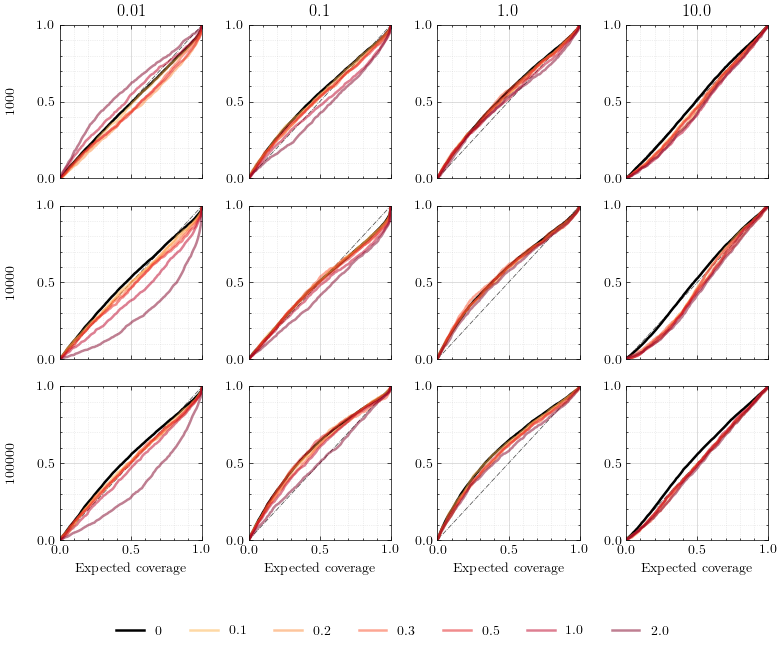

{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.0001, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.001, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.01, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose'

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


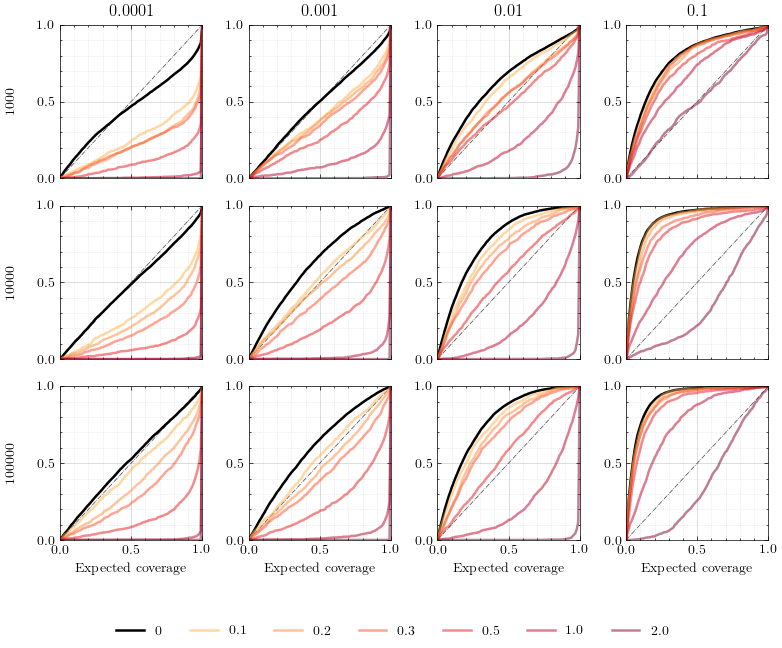

In [29]:
for task in ["gaussian_linear", "sir", "lotka_volterra", "hudgkin_huxley", "spatial_sir", "vae_task"]:
    with use_style("science_grid"):
        fig, axes = multi_plot(name, "params_defense_beta", "N_train", plot_expected_coverage, task=task, 
        model_name="maf", expand_params_defense=True, defense="FIMTraceRegularizer", figsize_per_col=figsize_col, 
        color_map=color_map_eps, figsize_per_row=figsize_row_expected_cov, with_eps=True, hue="eps", verbose=False, loss="NLLLoss",  metric_rob="ReverseKLRobMetric", attack="L2PGDAttack")
        fig.savefig(f"expected_coverages_fisher_defense_rKL_l2pgd_{task}_by_hyperparameter.svg")
        plt.show()

{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.0001, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.001, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.01, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': T

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


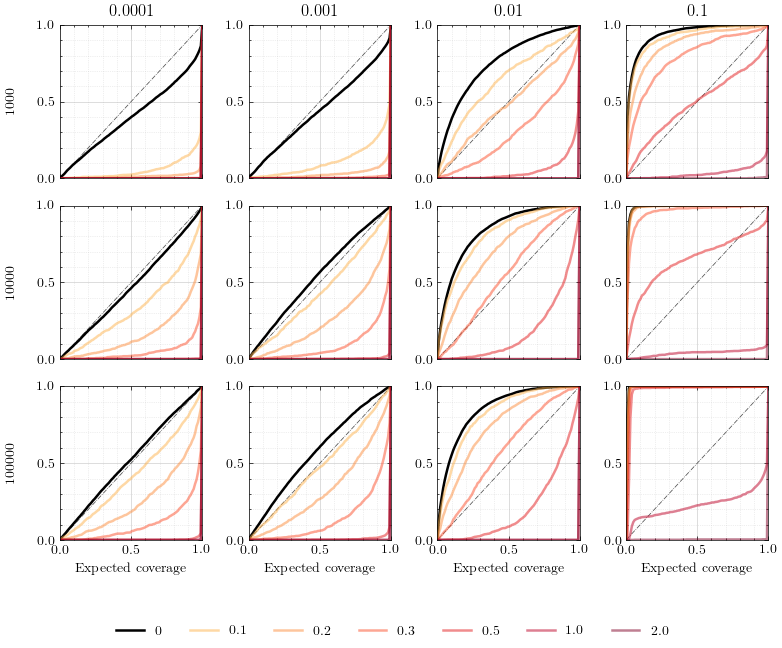

{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.0001, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.001, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.01, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NL

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


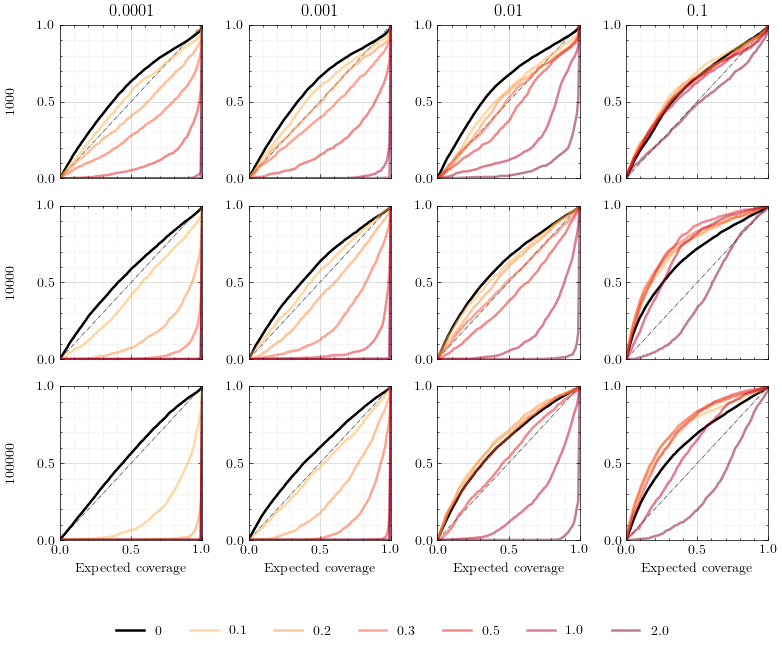

{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.0001, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.001, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.01, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True,

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


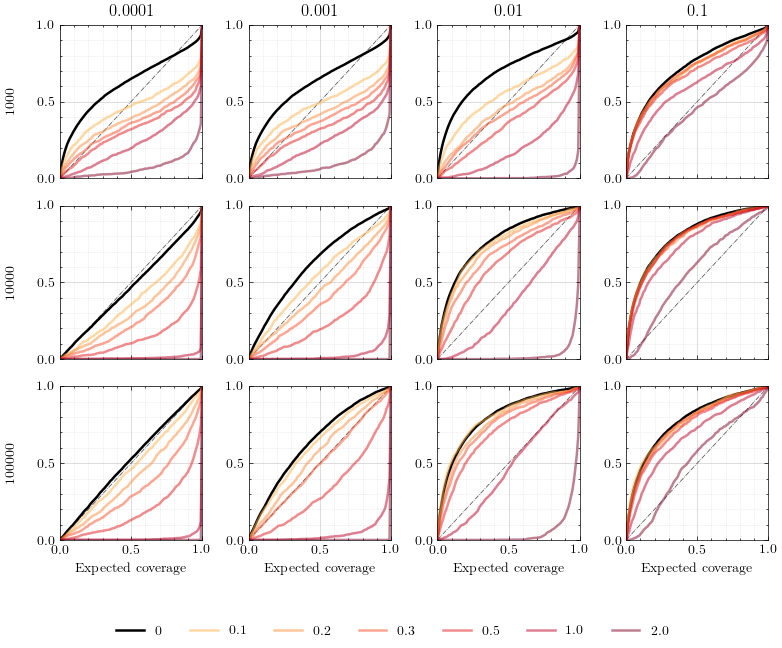

{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.1, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 1.0, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 10.0, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


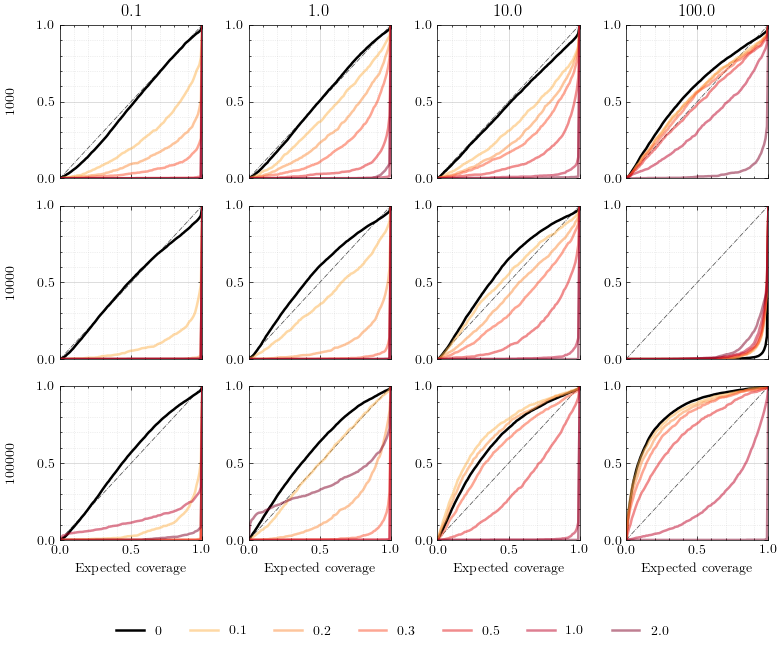

{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.01, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.1, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 1.0, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'v

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


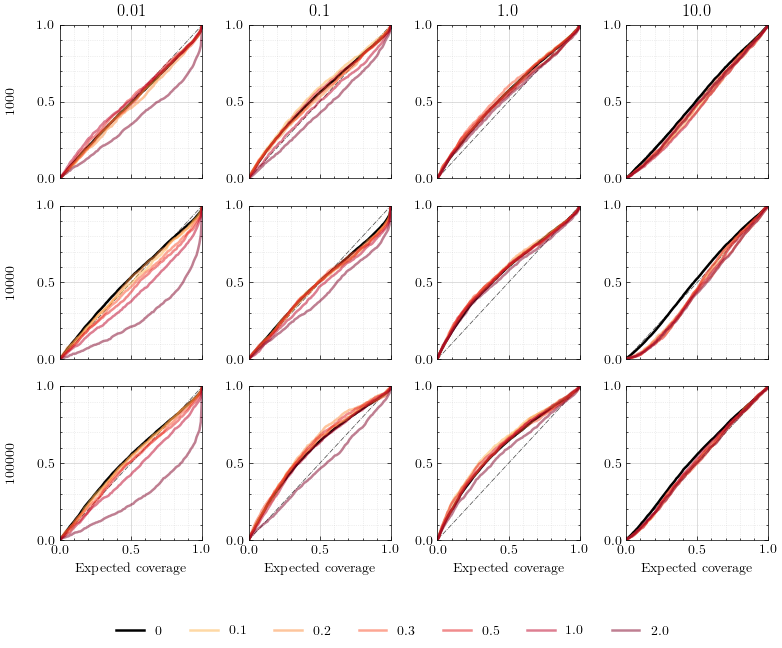

{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.0001, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.001, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_beta': 0.01, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'FIMTraceRegularizer', 'with_eps': True, 'hue': 'eps', 'verbose'

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


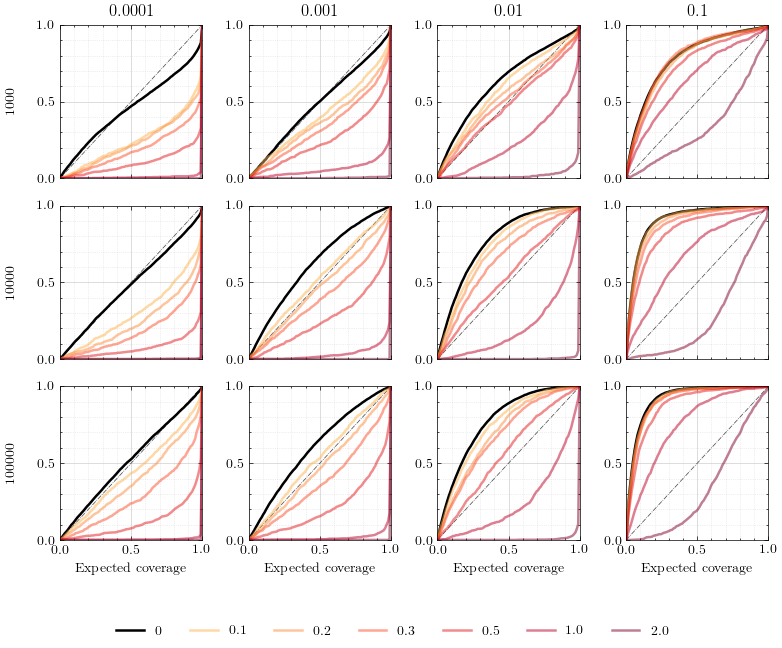

In [33]:
for task in ["gaussian_linear", "sir", "lotka_volterra", "hudgkin_huxley", "spatial_sir", "vae_task"]:
    with use_style("science_grid"):
        fig, axes = multi_plot(name, "params_defense_beta", "N_train", plot_expected_coverage, task=task, 
        model_name="maf", expand_params_defense=True, defense="FIMTraceRegularizer", figsize_per_col=figsize_col, 
        color_map=color_map_eps, figsize_per_row=figsize_row_expected_cov, with_eps=True, hue="eps", verbose=False, loss="NLLLoss",  metric_rob="ForwardKLRobMetric", attack="L2PGDAttack")
        fig.savefig(f"expected_coverages_fisher_defense_fKL_l2pgd_{task}_by_hyperparameter.svg")
        plt.show()

In [ ]:
for task in ["gaussian_linear", "sir", "lotka_volterra", "hudgkin_huxley", "spatial_sir", "vae_task"]:
    with use_style("science_grid"):
        fig, axes = multi_plot(name, "params_defense_eps", "N_train", plot_expected_coverage, task=task, model_name="maf", expand_params_defense=True,
                                defense="L2PGDrKLTrades", figsize_per_col=figsize_col, color_map=color_map_eps, figsize_per_row=figsize_row_expected_cov, with_eps=True, hue="eps", verbose=False, loss="NLLLoss",  metric_rob="ForwardKLRobMetric", attack="L2PGDAttack")
        fig.savefig(f"expected_coverages_l2pgdTrades_fKL_l2pgd_{task}_by_hyperparameter.svg")
        plt.show()

{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose':

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


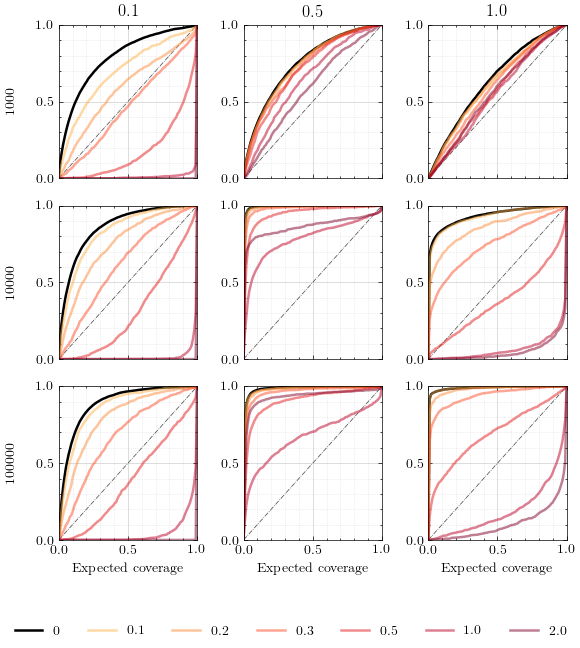

{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'Revers

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


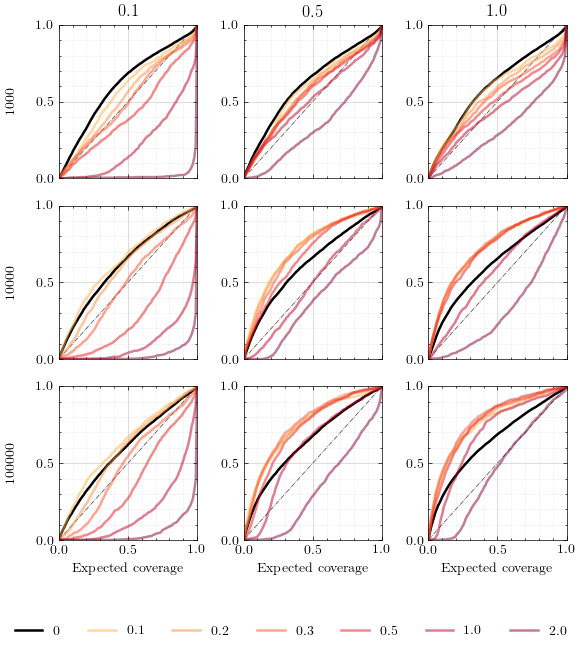

{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': Fal

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


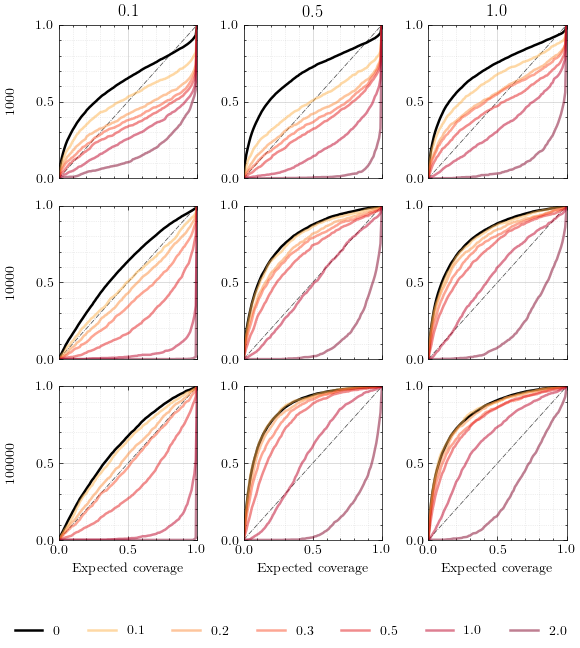

{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': Fal

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


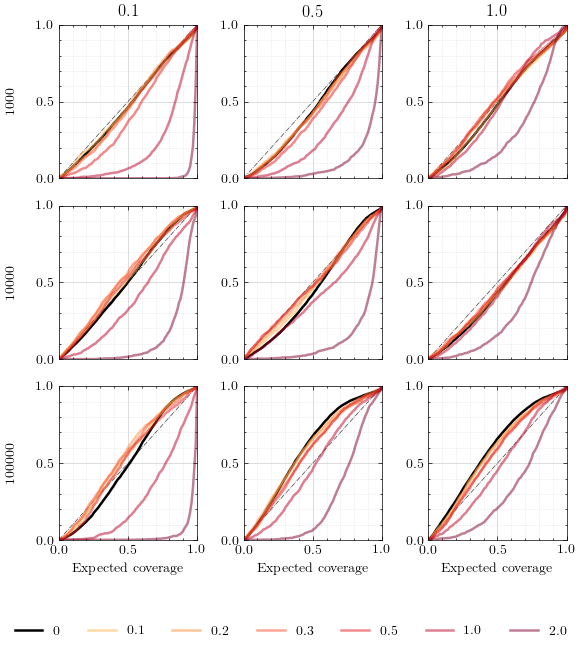

{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


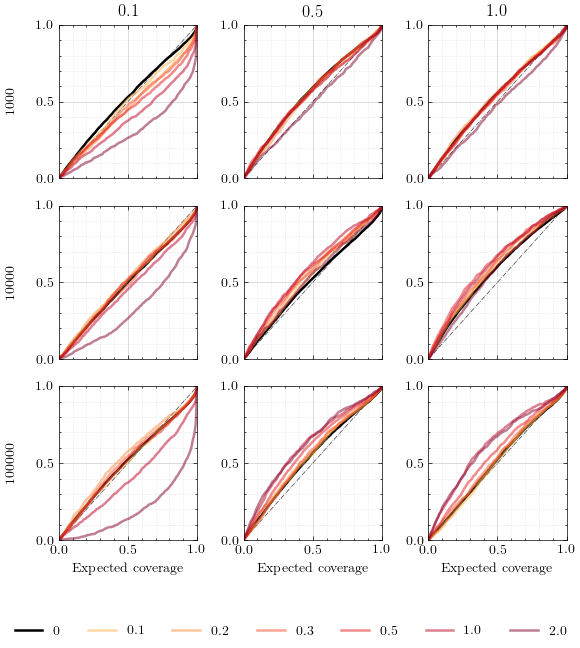

{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', '

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


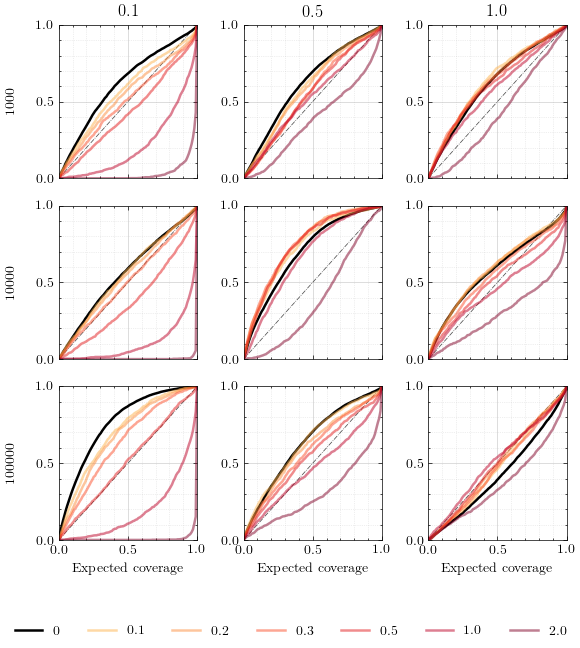

In [30]:
for task in ["gaussian_linear", "sir", "lotka_volterra", "hudgkin_huxley", "spatial_sir", "vae_task"]:
    with use_style("science_grid"):
        fig, axes = multi_plot(name, "params_defense_eps", "N_train", plot_expected_coverage, task=task, model_name="maf", expand_params_defense=True,
                                defense="L2PGDrKLTrades", figsize_per_col=figsize_col, color_map=color_map_eps, figsize_per_row=figsize_row_expected_cov, with_eps=True, hue="eps", verbose=False, loss="NLLLoss",  metric_rob="ReverseKLRobMetric", attack="L2PGDAttack")
        fig.savefig(f"expected_coverages_l2pgdTrades_rKL_l2pgd_{task}_by_hyperparameter.svg")
        plt.show()

{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGD

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


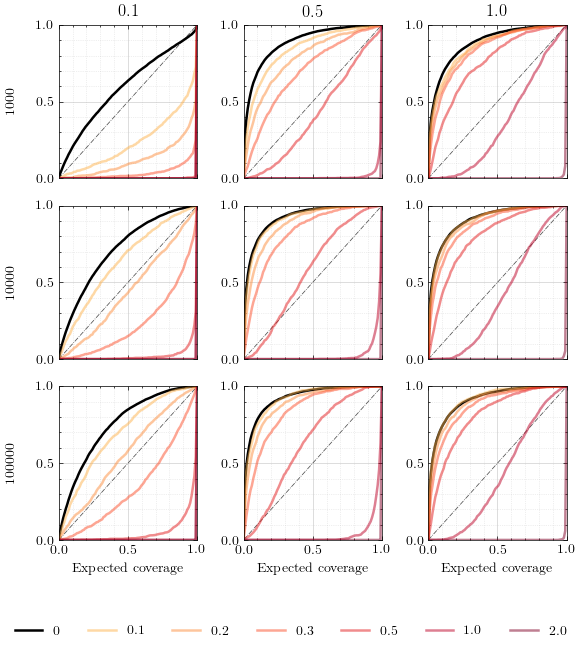

{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


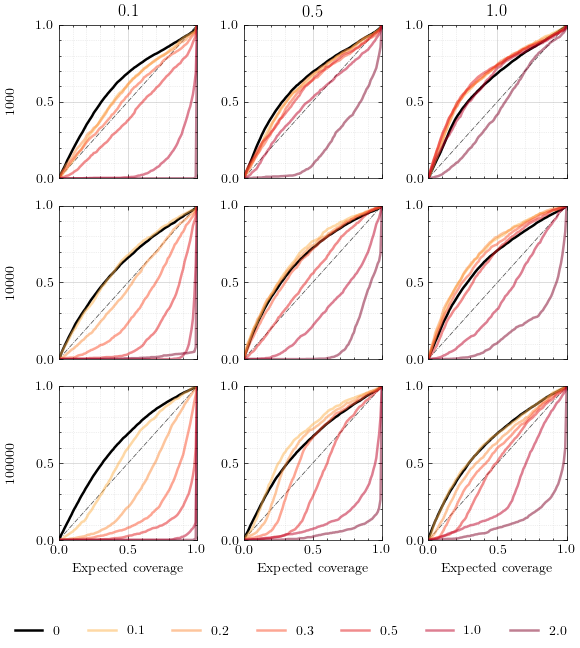

{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTarg

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


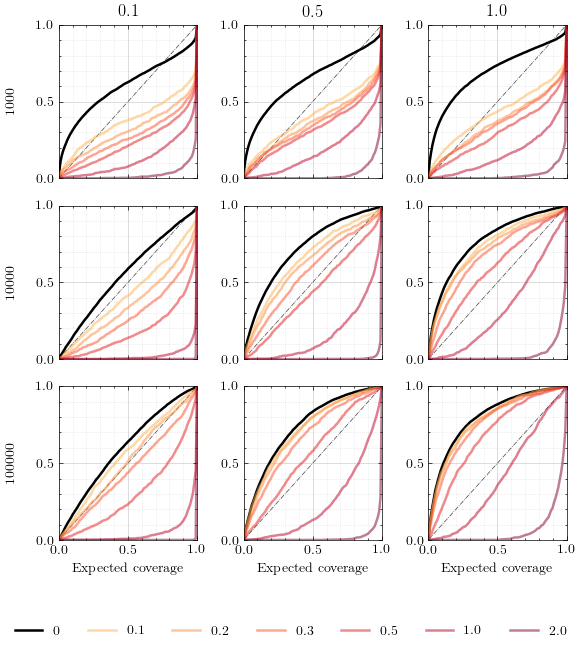

{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTarg

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


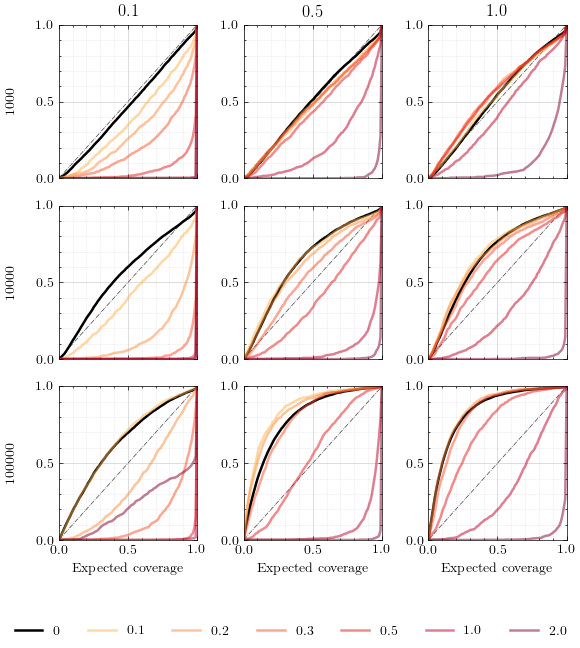

{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversar

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


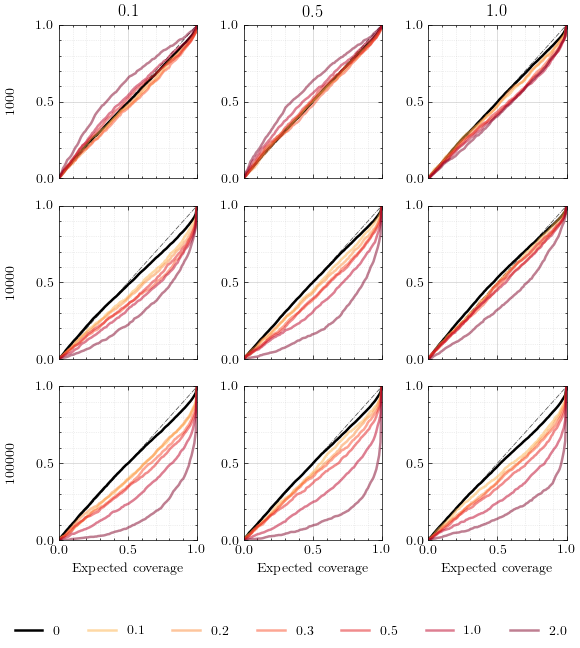

{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining'

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


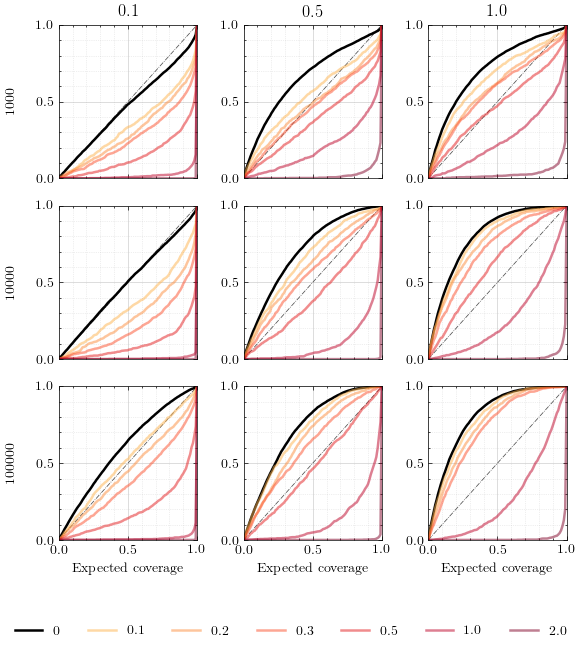

In [31]:
for task in ["gaussian_linear", "sir", "lotka_volterra", "hudgkin_huxley", "spatial_sir", "vae_task"]:
    with use_style("science_grid"):
        fig, axes = multi_plot(name, "params_defense_eps", "N_train", plot_expected_coverage, task=task, model_name="maf", expand_params_defense=True,
                                defense="L2PGDTargetedAdversarialTraining", figsize_per_col=figsize_col, color_map=color_map_eps, figsize_per_row=figsize_row_expected_cov, with_eps=True, hue="eps", 
                                verbose=False, loss="NLLLoss",  metric_rob="ReverseKLRobMetric", attack="L2PGDAttack")
        fig.savefig(f"expected_coverages_l2AdvTrain_rKL_l2pgd_{task}_by_hyperparameter.svg")
        plt.show()

{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGD

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


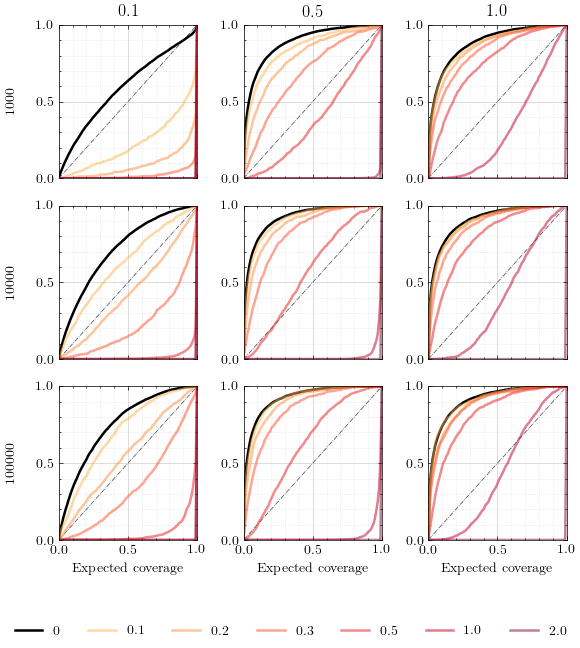

{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


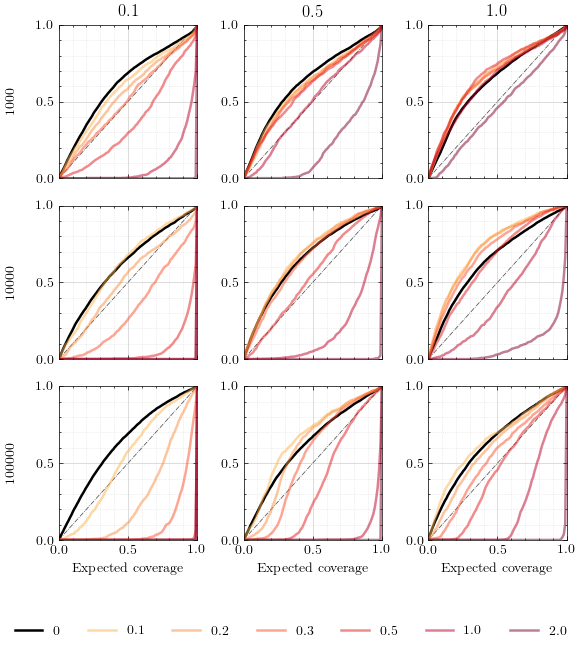

{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTarg

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


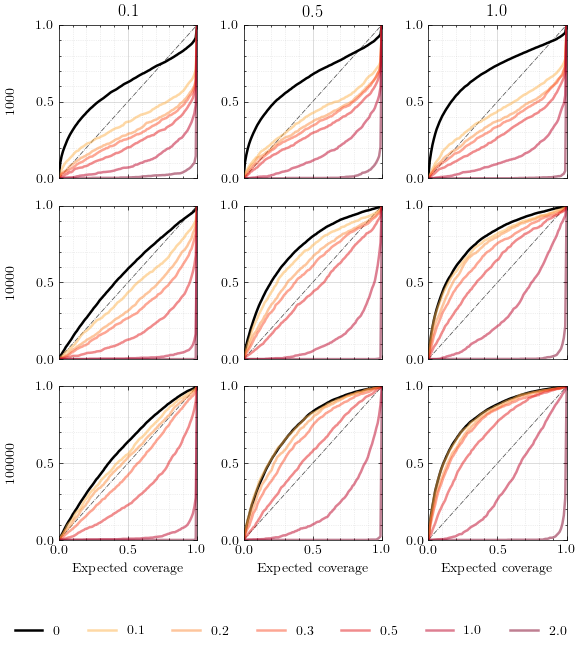

{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTarg

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


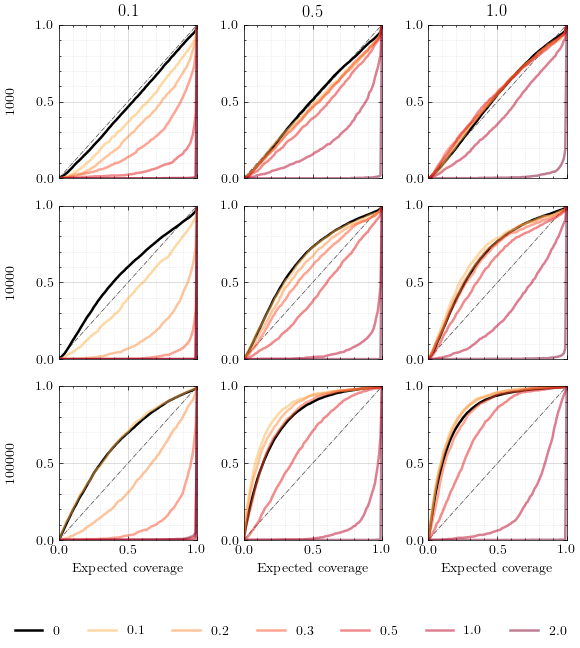

{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversar

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


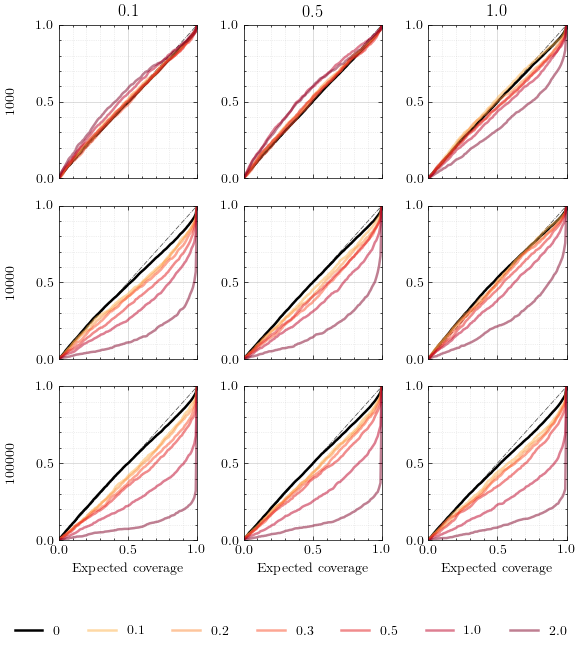

{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ForwardKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDTargetedAdversarialTraining'

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


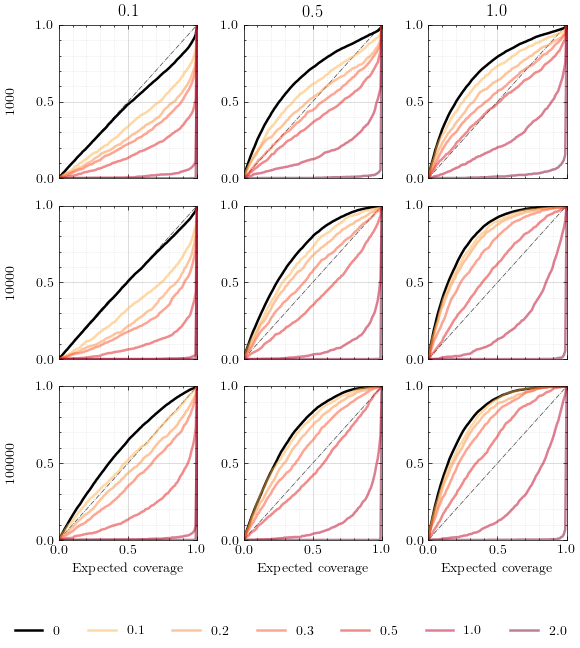

In [32]:
for task in ["gaussian_linear", "sir", "lotka_volterra", "hudgkin_huxley", "spatial_sir", "vae_task"]:
    with use_style("science_grid"):
        fig, axes = multi_plot(name, "params_defense_eps", "N_train", plot_expected_coverage, task=task, model_name="maf", expand_params_defense=True,
                                defense="L2PGDTargetedAdversarialTraining", figsize_per_col=figsize_col, color_map=color_map_eps, figsize_per_row=figsize_row_expected_cov, with_eps=True, hue="eps", 
                                verbose=False, loss="NLLLoss",  metric_rob="ForwardKLRobMetric", attack="L2PGDAttack")
        fig.savefig(f"expected_coverages_l2AdvTrain_fKL_l2pgd_{task}_by_hyperparameter.svg")
        plt.show()

{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'gaussian_linear', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose':

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


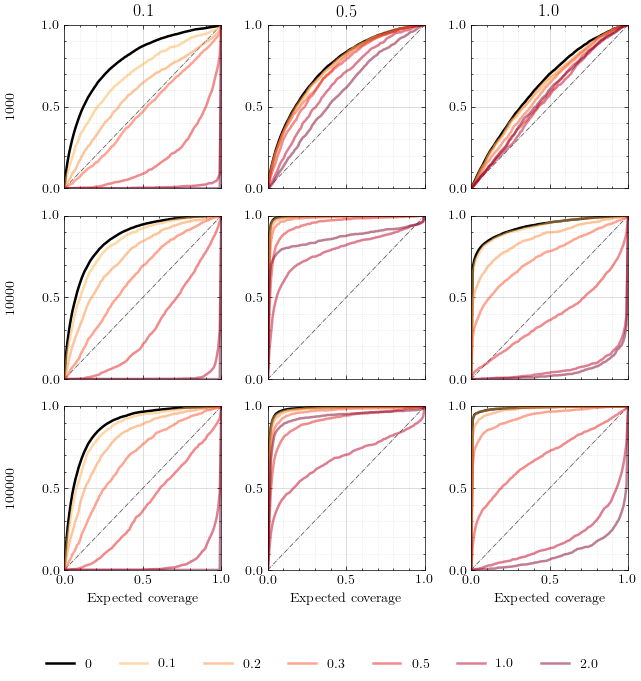

{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'Revers

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


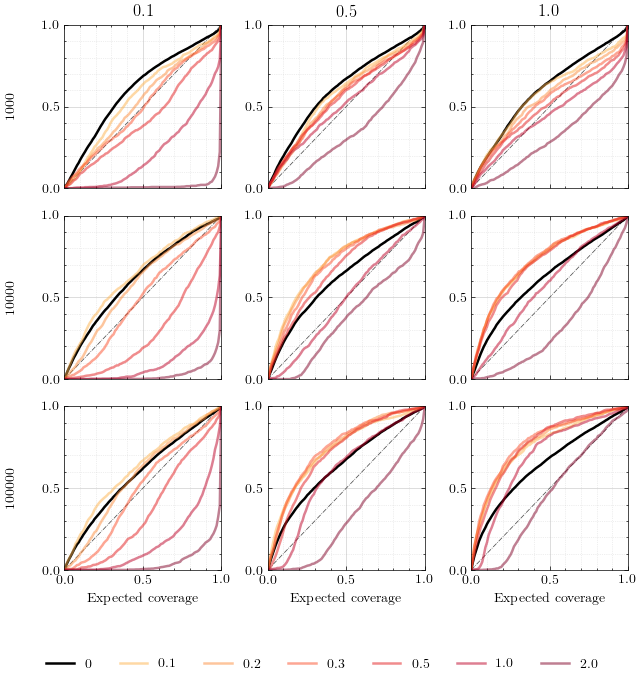

{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'lotka_volterra', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': Fal

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


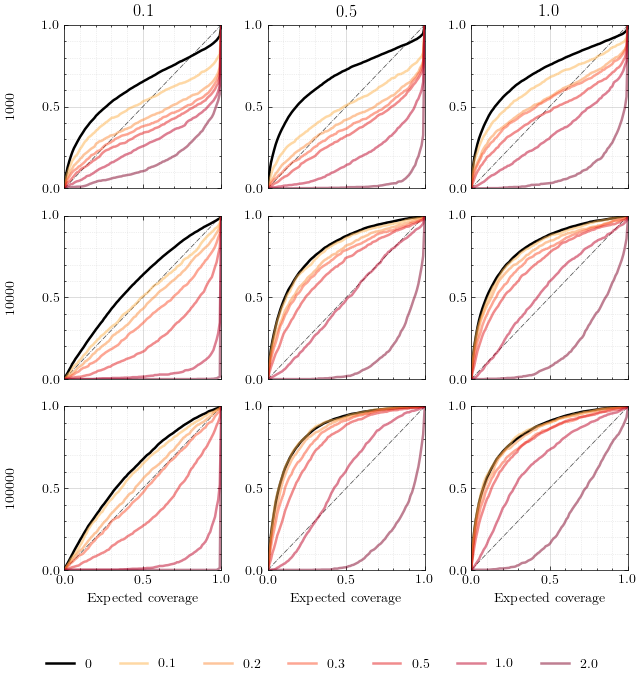

{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'hudgkin_huxley', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': Fal

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


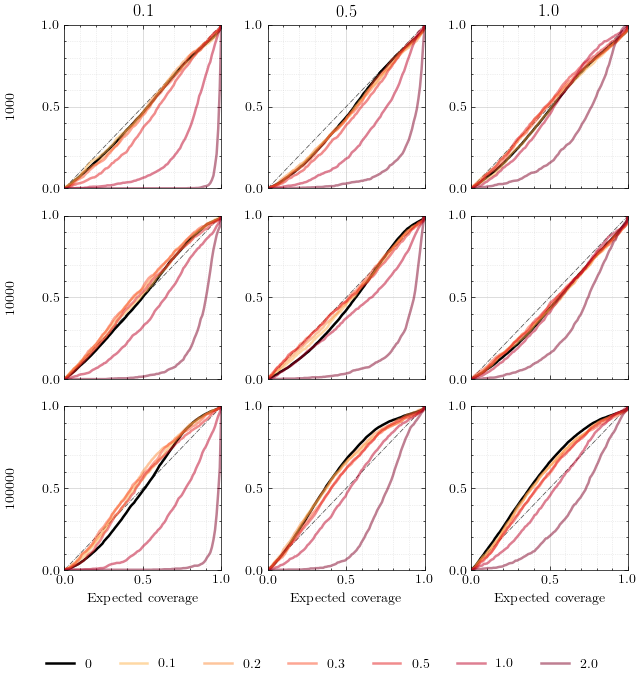

{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'spatial_sir', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


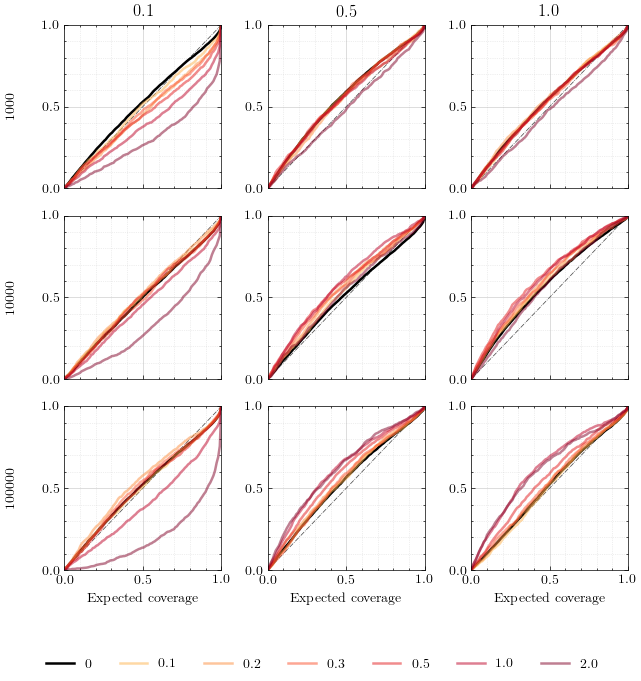

{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.1, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 0.5, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', 'metric_rob': 'ReverseKLRobMetric', 'attack': 'L2PGDAttack', 'params_defense_eps': 1.0, 'N_train': 1000}
{'task': 'vae_task', 'model_name': 'maf', 'expand_params_defense': True, 'defense': 'L2PGDrKLTrades', 'with_eps': True, 'hue': 'eps', 'verbose': False, 'loss': 'NLLLoss', '

/mnt/qb/home/macke/mgloeckler90/rbibm/rbibm/plots/multi_plots.py:231: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


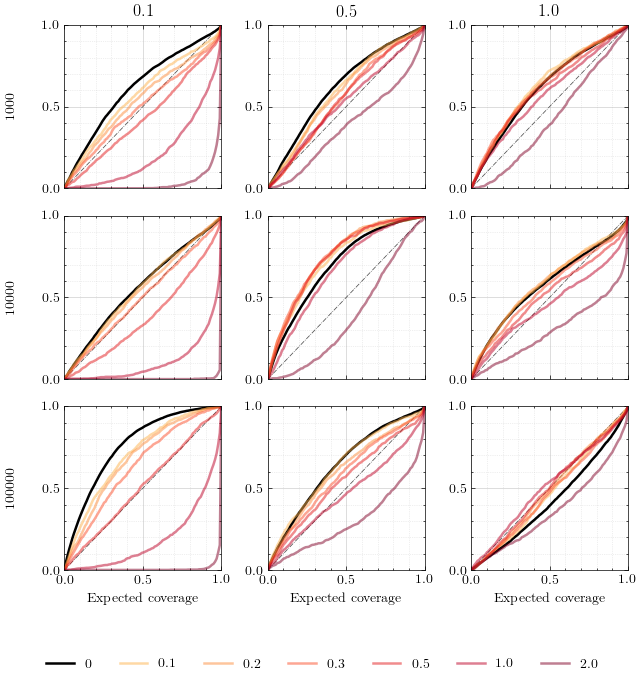

In [73]:
for task in ["gaussian_linear", "sir", "lotka_volterra", "hudgkin_huxley", "spatial_sir", "vae_task"]:
    with use_style("science_grid"):
        fig, axes = multi_plot(name, "params_defense_eps", "N_train", plot_expected_coverage, 
                               task=task, model_name="maf", expand_params_defense=True, 
                               defense="L2PGDrKLTrades", figsize_per_col=2.2, 
                               color_map=color_map_eps, figsize_per_row=2.1, with_eps=True,
                                hue="eps", verbose=False, loss="NLLLoss", 
                                 metric_rob="ReverseKLRobMetric", attack="L2PGDAttack")
        fig.savefig(f"expected_coverages_l2pgdrKLTrades_rKL_l2pgd_{task}_by_hyperparameter.svg")
        plt.show()

In [34]:
with use_style(science_grid):
    plt.text(0,0,r"$D_{KL}(q||\tilde{x})")

NameError: name 'science_grid' is not defined

In [88]:
query_main(name, defense="L2PGDrKLTrades", model_name="maf", task="hudgkin_huxley", params_defense_eps=1.)

,id,task,loss,defense,model_name,N_train,N_val,N_test,train_loss,validation_loss,test_loss,train_time,sim_time,seed
1742,c070b955-8748-4c60-b7b4-7629b95b51ff,hudgkin_huxley,NLLLoss,L2PGDrKLTrades,maf,1000,512,10000,15.627882,16.386898,14.690166,52.262424,NaN,0
1751,858a5ed8-b273-489d-a41f-b6af09847bce,hudgkin_huxley,NLLLoss,L2PGDrKLTrades,maf,10000,512,10000,5364.532715,7170.799805,14.739157,214.559671,NaN,0
1809,85774552-242a-491f-a928-81913d8cbcad,hudgkin_huxley,NLLLoss,L2PGDrKLTrades,maf,100000,512,10000,14.017864,14.253184,14.044653,9614.074661,NaN,0


In [94]:
query_main(name, defense="FIMTraceRegularizer", model_name="maf", task="sir", params_defense_beta=0.1)

,id,task,loss,defense,model_name,N_train,N_val,N_test,train_loss,validation_loss,test_loss,train_time,sim_time,seed
254,f61f99cf-0a77-43fd-a7ea-1c6bfa254291,sir,NLLLoss,FIMTraceRegularizer,maf,1000,512,10000,2.595570,3.288556,2.734775,4.883403,NaN,0
261,f2c2525e-f001-4d37-90ab-9a178d06ba97,sir,NLLLoss,FIMTraceRegularizer,maf,10000,512,10000,2.019521,1.879337,1.975022,24.190092,NaN,0
271,9383e00f-3667-4eed-a7c2-5b9ee8d1f95f,sir,NLLLoss,FIMTraceRegularizer,maf,100000,512,10000,1.912107,1.969642,1.906392,103.892022,NaN,0


In [90]:
remove_entry_by_id(name, "6b7f79d3-d6f4-465b-9ade-ab2481446318")

In [91]:
remove_entry_by_id(name, "fb60c1af-0057-4b7f-80e1-e40683ebca7a")

In [92]:
remove_entry_by_id(name, "4af98ae5-c74c-430d-aba2-ca64ce9e52bd")

In [58]:
query(name, task="spatial_sir").groupby("eps").first()["eps_abs"]

eps
0.1    0.022404
0.2    0.044809
0.3    0.067213
0.5    0.112022
1.0    0.224044
2.0    0.448089
Name: eps_abs, dtype: float64